In [1]:
from IPython.display import HTML
HTML("""
<div id="popup" style="padding-bottom:5px; display:none;">
    <div>Enter Password:</div>
    <input id="password" type="password"/>
    <button onclick="done()" style="border-radius: 12px;">Submit</button>    
</div>
<button onclick="unlock()" style="border-radius: 12px;">Unclock</button>
""")

In [2]:
%run initscript.py

import pandas as pd
from pandas.plotting import lag_plot
import numpy as np
import matplotlib as mlp
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import seaborn as sns
from ipywidgets import *
%matplotlib inline
import pmdarima as pm

import warnings
warnings.filterwarnings('ignore')

dataurl = 'https://raw.githubusercontent.com/ming-zhao/Business-Analytics/master/data/time_series/'

df_house = pd.read_csv(dataurl+'house_sales.csv', parse_dates=['date'], header=0, index_col='date')
df_house['year'] = [d.year for d in df_house.index]
df_house['month'] = [d.strftime('%b') for d in df_house.index]

df_drink = pd.read_csv(dataurl+'drink_sales.csv', parse_dates=['date'], header=0)
df_drink['date'] = [pd.to_datetime(''.join(df_drink.date.str.split('-')[i][-1::-1])) 
                       + pd.offsets.QuarterEnd(0) for i in df_drink.index]
df_drink = df_drink.set_index('date')
# df_drink[['q','year']]=df_drink['quarter'].str.split('-',expand=True)
df_drink['year'] = [d.year for d in df_drink.index]
df_drink['quarter'] = ['Q'+str(d.month//3) for d in df_drink.index]

noise = pd.Series(np.random.randn(200))
def randomwalk(drift):
    return pd.Series(np.cumsum(np.random.uniform(-1,1,(200,1)) + drift*np.ones((200,1))))

toggle()

# Time Series Analysis and Forecasting

## Time Series Data

Time series is a sequence of observations recorded at regular time intervals with many applications such as in demand and sales, number of visitors to a website, stock price, etc. In this section, we focus on two time series datasets that one is the US houses sales and the other is the soft drink sales.

### Read and plot data

The python package `pandas` is used to read `.cvs` data file. The first 5 rows are shown as below.

In [3]:
df_house.head()

,sales,year,month
date,,,
1991-01-01,401,1991,Jan
1991-02-01,482,1991,Feb
1991-03-01,507,1991,Mar
1991-04-01,508,1991,Apr
1991-05-01,517,1991,May


In [4]:
df_drink.head()

,sales,year,quarter
date,,,
2001-03-31,1807.37,2001,Q1
2001-06-30,2355.32,2001,Q2
2001-09-30,2591.83,2001,Q3
2001-12-31,2236.39,2001,Q4
2002-03-31,1549.14,2002,Q1


There are univariate and multivariate time series where
- A univariate time series is a series with a single time-dependent variable, and
- A Multivariate time series has more than one time-dependent variable. Each variable depends not only on its past values but also has some dependency on other variables. This dependency is used for forecasting future values.

Our datasets are univariate time series. Time series data can be thought of as special cases of panel data. Panel data (or longitudinal data) also involves measurements over time. The difference is that, in addition to time series, it also contains one or more related variables that are measured for the same time periods. 

Now, We plot the time series data

In [5]:
def plot_time_series(df, col_name, freq='Month', title=''):
    ax = df.plot(y=col_name, figsize=(15,6), x_compat=True)
    ax.set_xlim(pd.to_datetime(df.index[0]), 
                pd.to_datetime(str(pd.Timestamp(df.index[-1]).year+1) + '-01-01'))
    if freq=='Month':
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    plt.title(title)
    plt.show()

toggle()

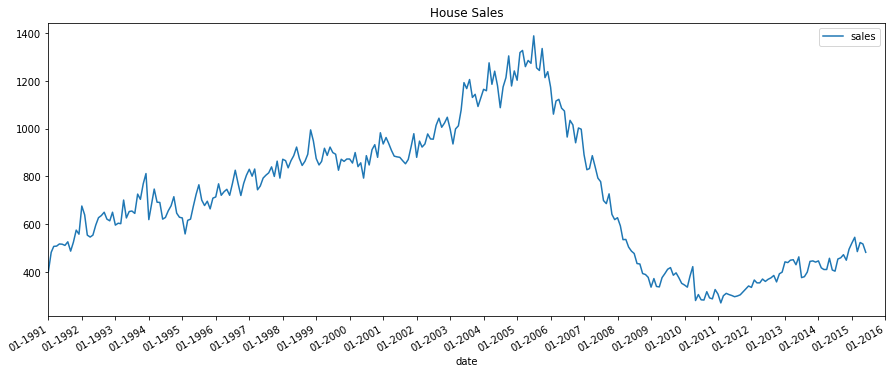

In [6]:
plot_time_series(df_house, 'sales', title='House Sales')

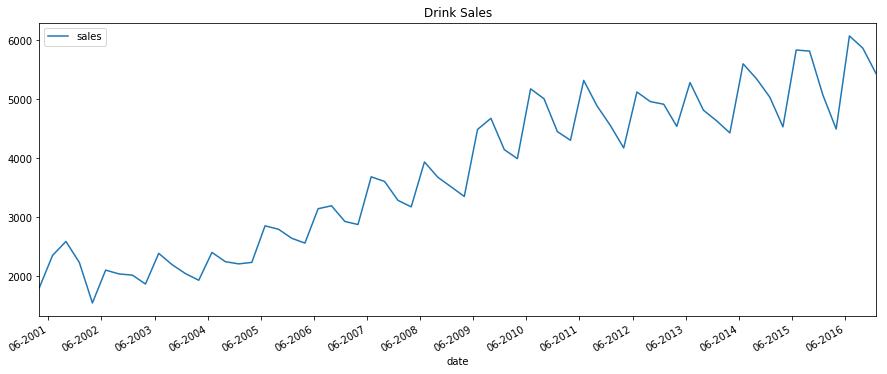

In [7]:
plot_time_series(df_drink, 'sales', title='Drink Sales')

### White noise

A time series is white noise if the observations are independent and identically distributed with a mean of zero. This means that all observations have the same variance and each value has a zero correlation with all other values in the series. White noise is an important concept in time series analysis and forecasting because:
- Predictability: if the time series is white noise, then, by definition, it is random. We cannot reasonably model it and make predictions.
- Model diagnostics: the series of errors from a time series forecast model should ideally be white noise.

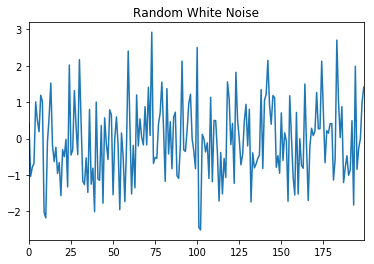

In [8]:
noise.plot(title='Random White Noise')
plt.show()
toggle()

### Random walk

The series itself is not random. However, its differences - that is, the changes from one period to the next - are random. The random walk model is

$$Y_t = Y_{t-1} + \mu + e_t$$

and the difference form of random walk model is

$$DY_{t} = Y_t - Y_{t-1} = \mu + e_t$$

where $\mu$ is the drift. Apparently, the series tends to trend upward if $\mu > 0$ or downward if $\mu < 0$.

In [9]:
def random_walk(drift):
    np.random.seed(123)
    randomwalk(drift).plot(title='Random Walk')

interact(random_walk, drift=widgets.FloatSlider(min=-0.1,max=0.1,step=0.01,value=0,description='Drift:'))
plt.show()
toggle()

interactive(children=(FloatSlider(value=0.0, description='Drift:', max=0.1, min=-0.1, step=0.01), Output()), _…

### Seasonal plot of a time series

The datasets are either a monthly or quarterly time series. They may follows a certain repetitive pattern every year. So, we can plot each year as a separate line in the same plot. This allows us to compare the year-wise patterns side-by-side.

In [10]:
def seasonal_plot(df, col_names, title=''):
    np.random.seed(100)
    years = pd.Series([x.year for x in df.index]).unique()
    mycolors = np.random.choice(list(mlp.colors.XKCD_COLORS.keys()), len(years), replace=False)
    
    plt.subplots(1, 1, figsize=(12,6), dpi=120)
    
    label_shift = .4
    if col_names[0]=='quarter':
        label_shift = .8
    
    for i, y in enumerate(years):
        if i > 0:        
            plt.plot(col_names[0], col_names[1], data=df.loc[df.year==y, :], color=mycolors[i], label=y)
            plt.text(df.loc[df.year==y, :].shape[0]-label_shift, 
                     df.loc[df.year==y, col_names[1]][-1:].values[0], y, color=mycolors[i], fontsize=12)
    plt.title(title)

toggle()

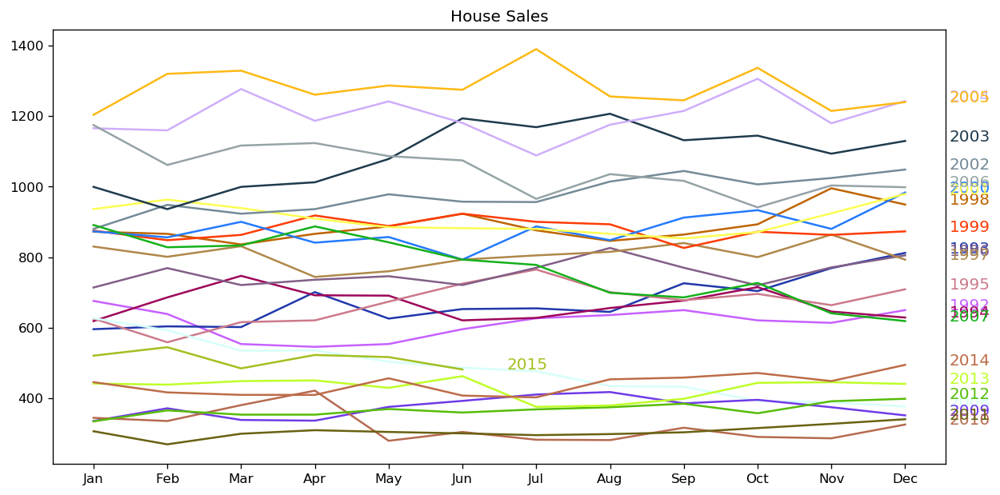

In [11]:
seasonal_plot(df_house, ['month','sales'], title='House Sales')

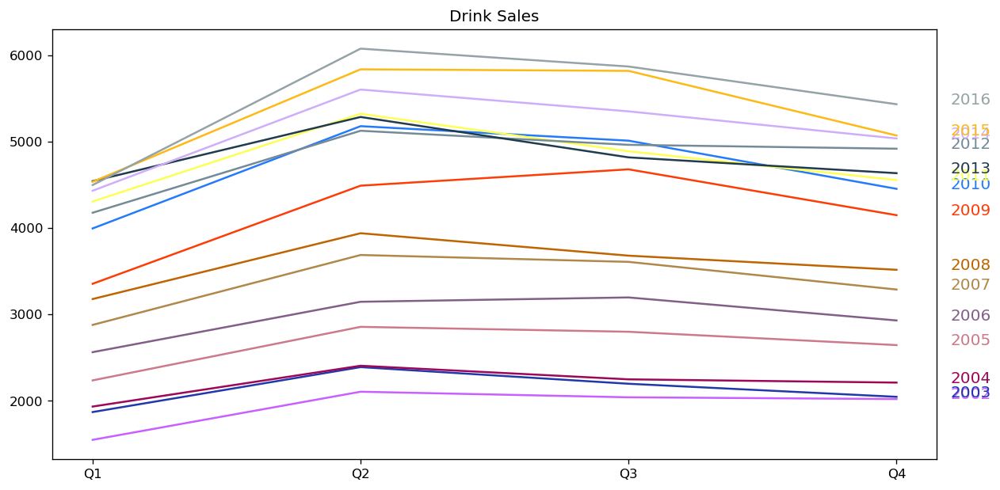

In [12]:
seasonal_plot(df_drink, ['quarter','sales'], title='Drink Sales')

What do you find in the seasonal plots?

In [13]:
hide_answer()

For house sales, we do not see a clear repetitive pattern in each year. It is also difficult to identify a clear trend among years.

For drink sales, there is a clear pattern repeating every year. It shows a steep increase in drink sales every 2nd quarter. Then, it is falling slightly in the 3rd quarter and so on. As years progress, the drink sales increase overall.

### Boxplot of seasonal and trend distribution

We can visualize the trend and how it varies each year in a year-wise or month-wise boxplot for house sales, as well as quarter-wise boxplot for drink sales.

In [14]:
def boxplot(df, col_names, title=''):
    fig, axes = plt.subplots(1, 2, figsize=(18,6), dpi=120)
    sns.boxplot(x='year', y=col_names[1], data=df, ax=axes[0])
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=30)
    sns.boxplot(x=col_names[0], y=col_names[1], data=df)

    axes[0].set_title('Year-wise Box Plot for {}\n(The Trend)'.format(title), fontsize=14); 
    axes[1].set_title('Month-wise Box Plot for {}\n(The Seasonality)'.format(title), fontsize=14)
    plt.show()

toggle()

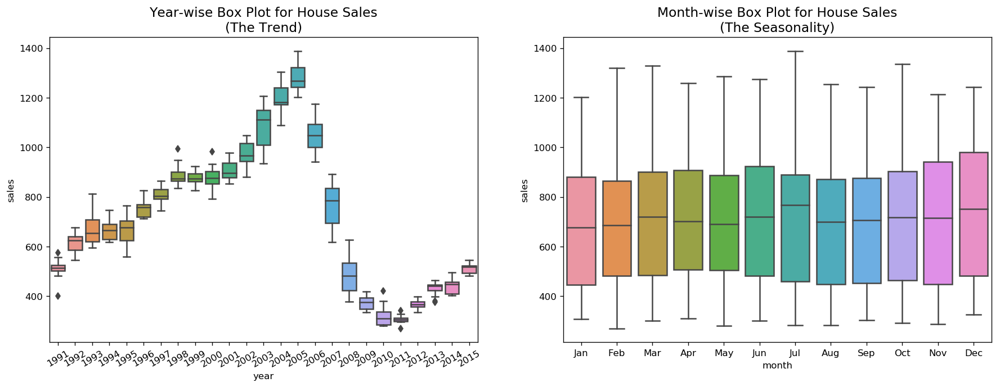

In [15]:
boxplot(df_house, ['month','sales'], title='House Sales')

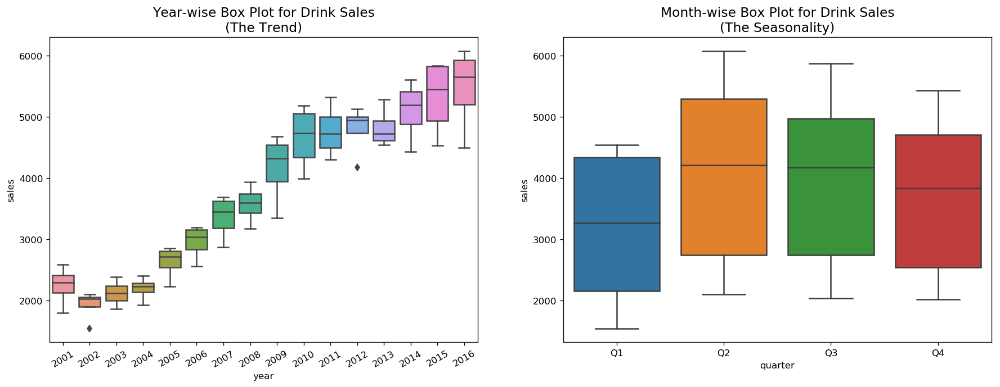

In [16]:
boxplot(df_drink, ['quarter','sales'], title='Drink Sales')

What do you find in the boxplot?

In [17]:
hide_answer()

High house sales in summer

### Smoothen a time series

Smoothening of a time series may be useful in:
- Reducing the effect of noise in a signal get a fair approximation of the noise-filtered series.
- The smoothed version of series can be used as a feature to explain the original series itself.
- Visualize the underlying trend better

**Moving average smoothing** is certainly the most common smoothening method.

In [18]:
def moving_average(span = 3):
    fig, ax = plt.subplots(1, 1, figsize = (12,6))
    df_ma = df_house.sales.rolling(span).mean()
    df_ma.plot(ax=ax, title='Moving Average ({})'.format(span), c='red')
    df_house.sales.plot(ax=ax, c='teal')
    ax.legend(labels=['Moving Average', 'Original'])
    fig.canvas.draw()
    
interact(moving_average, span=widgets.IntSlider(min=3,max=30,step=3,value=6,description='Span:'))
plt.show()

toggle()

interactive(children=(IntSlider(value=6, description='Span:', max=30, min=3, step=3), Output()), _dom_classes=…

There are other methods such as LOESS smoothing (LOcalized regrESSion) and LOWESS smoothing (LOcally Weighted regrESSion).

LOESS fits multiple regressions in the local neighborhood of each point. It is implemented in the `statsmodels` package, where we can control the degree of smoothing using `frac` argument which specifies the percentage of data points nearby that should be considered to fit a regression model.

In [19]:
def lowess_smooth(frac=0.05):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    fig, ax = plt.subplots(1, 1, figsize = (12,6))
    df_loess= pd.DataFrame(lowess(df_house.sales, np.arange(len(df_house.sales)), frac=frac)[:, 1], 
                          index=df_house.index, columns=['value'])
    df_loess['value'].plot(ax=ax, title='Loess Smoothed {}%'.format(frac*100), c='red')
    df_house.sales.plot(ax=ax, c='teal')
    ax.legend(labels=['Lowess Smooth', 'Original'])
    fig.canvas.draw()
    
interact(lowess_smooth, frac=widgets.FloatSlider(min=0.05,max=0.3,step=0.05,value=0.05,description='Frac:'))
plt.show()

toggle()

interactive(children=(FloatSlider(value=0.05, description='Frac:', max=0.3, min=0.05, step=0.05), Output()), _…

## Exponential Smoothing Forecasts

### Simple exponential smoothing

In [20]:
def ses_forecast(forecasts, holdouts, level, optimized):
    from statsmodels.tsa.holtwinters import SimpleExpSmoothing
    df_house.index.freq = 'MS'
    plt.figure(figsize=(12, 6))
    if holdouts==0:
        train, test = df_house.iloc[:, 0], []
        model = SimpleExpSmoothing(train).fit(smoothing_level=level, optimized=optimized)
        pred = model.predict(start=train.index[0], end=train.index[-1] + forecasts*df_house.index.freq)
    else:
        train, test = df_house.iloc[:-holdouts, 0], df_house.iloc[-holdouts:, 0]
        model = SimpleExpSmoothing(train).fit(smoothing_level=level, optimized=optimized)
        pred = model.predict(start=train.index[0], end=test.index[-1] + forecasts*df_house.index.freq)
        plt.plot(test.index, test, label='Holdouts', c='fuchsia')

    plt.plot(train.index, train, label='Train', c='cornflowerblue')
    plt.plot(pred.index, pred, label='Simple Exponential Smoothing', c='orange')
    plt.legend(loc='best')
    plt.title('House Sales')
    plt.show()
    
widgets.interact_manual.opts['manual_name'] = 'Run Forecast'
interact_manual(ses_forecast,
         forecasts=widgets.BoundedIntText(value=12, min=1, description='Forecasts:', disabled=False),
         holdouts=widgets.BoundedIntText(value=0, min=0, description='Holdouts:', disabled=False),
         level=widgets.BoundedFloatText(value=0.2, min=0, max=1, step=0.05, description='Level:', disabled=False),
         optimized=widgets.Checkbox(value=False, description='Optimize Parameters', disabled=False))
plt.show()

toggle()

interactive(children=(BoundedIntText(value=12, description='Forecasts:', min=1), BoundedIntText(value=0, descr…

### Holt's model for trend

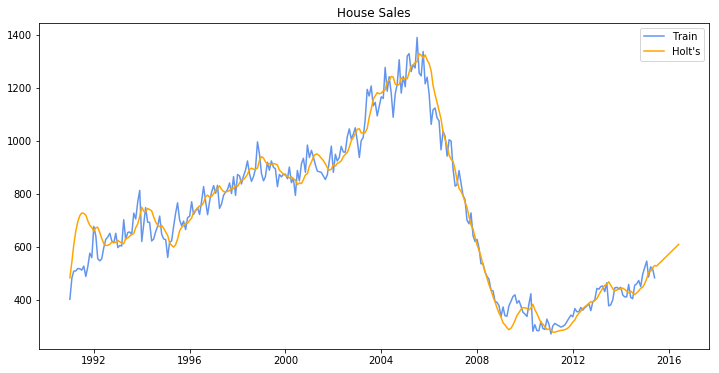

In [21]:
from statsmodels.tsa.holtwinters import Holt

# df_house.index.freq = 'MS'
plt.figure(figsize=(12, 6))
train = df_house.iloc[:, 0]
train.index = pd.DatetimeIndex(train.index.values, freq=train.index.inferred_freq)
model = Holt(train).fit(smoothing_level=0.2, smoothing_slope=0.2, optimized=False)
pred = model.predict(start=train.index[0], end=train.index[-1] + 12*train.index.freq)

plt.plot(train.index, train, label='Train', c='cornflowerblue')
plt.plot(pred.index, pred, label='Holt\'s', c='orange')
plt.legend(loc='best')
plt.title('House Sales')
plt.show()

toggle()

### Winters' exponential smoothing model

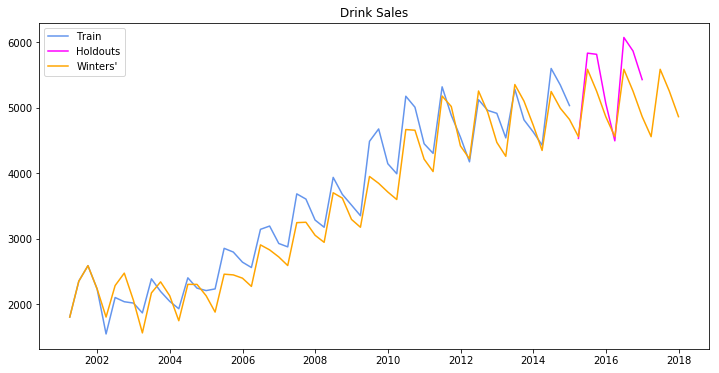

In [22]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

plt.figure(figsize=(12, 6))
train, test = df_drink.iloc[:-8, 0], df_drink.iloc[-8:,0]
train.index = pd.DatetimeIndex(train.index.values, freq=train.index.inferred_freq)

model = ExponentialSmoothing(train, seasonal='mul', seasonal_periods=4).fit(smoothing_level=0.2, 
                                        smoothing_slope=0.2,
                                        smoothing_seasonal=0.4,
                                        optimized=False)
pred = model.predict(start=train.index[0], end=test.index[-1] + 4*train.index.freq)

plt.plot(train.index, train, label='Train', c='cornflowerblue')
plt.plot(test.index, test, label='Holdouts', c='fuchsia')
plt.plot(pred.index, pred, label='Winters\'', c='orange')
plt.legend(loc='best')
plt.title('Drink Sales')
plt.show()

toggle()

## Stationarity and Forecastability

A time series is stationary if the values of the series is not a function of time. Therefore, A stationary time series has constant mean and variance. More importantly, the correlation of the series with its previous values (lags) is also constant. The correlation is called **Autocorrelation**.

The mean of the series should not be a function of time. The red graph below is not stationary because the mean increases over time.
<img src="https://raw.githubusercontent.com/ming-zhao/Business-Analytics/master/images/stationary1.png" width="500">

The variance of the series should not be a function of time. This property is known as homoscedasticity. Notice in the red graph the varying spread of data over time.
<img src="https://raw.githubusercontent.com/ming-zhao/Business-Analytics/master/images/stationary2.png" width="500">

Finally, the covariance of the $i$th time and the $(i + m)$th time should not be a function of time. In the following graph, we notice the spread becomes closer as the time increases. Hence, the covariance is not constant with time for the ‘red series’.
<img src="https://raw.githubusercontent.com/ming-zhao/Business-Analytics/master/images/stationary3.png" width="500">

For example, white noise is a stationary series. However, random walk is always non-stationary because of its variance depends on time.

### How to make a time series stationary?

It is possible to make nearly any time series stationary by applying a suitable transformation. The first step in the forecasting process is typically to do some transformation to convert a non-stationary series to stationary. The transformation includes
1. Differencing the Series (once or more)
2. Take the log of the series
3. Take the nth root of the series
4. Combination of the above

The most common and convenient method to stationarize a series is by differencing. Let $Y_t$ be the value at time $t$, the fist difference of $Y$ is $Y_t - Y_{t-1}$, i.e., subtracting the next value by the current value. If the first difference does not make a series stationary, we can apply the second differencing, and so on.

In [23]:
Y = [1, 5, 8, 3, 15, 20]
print('Y = {}\nFirst differencing is {}, Second differencing is {}'.format(Y, np.diff(Y,1), np.diff(Y,2)))
toggle()

Y = [1, 5, 8, 3, 15, 20]
First differencing is [ 4  3 -5 12  5], Second differencing is [-1 -8 17 -7]


### Why does a stationary series matter?

- Most statistical forecasting methods are designed to work on a stationary time series.
- Forecasting a stationary series is relatively easy and the forecasts are more reliable.
- An important reason is, autoregressive forecasting models are essentially linear regression models that utilize the lag(s) of the series itself as predictors.

We know that linear regression works best if the predictors ($X$ variables) are not correlated against each other. So, stationarizing the series solves this problem since it removes any persistent autocorrelation, thereby making the predictors(lags of the series) in the forecasting models nearly independent.

### Test for stationarity

The most commonly used is the Augmented Dickey Fuller (ADF) test, where the null hypothesis is the time series possesses a unit root and is non-stationary. So, if the P-Value in ADH test is less than the significance level (for example 5%), we reject the null hypothesis.

The KPSS test, on the other hand, is used to test for trend stationarity.  If $Y_t$ is a trend-stationary process, then 

$$Y_t = \mu_t + e_t$$

where:
- $\mu_t$ is a deterministic mean trend,
- $e_t$ is a stationary stochastic process with mean zero.

For the KPSS test, the null hypothesis and the P-Value interpretation is just the opposite of ADH test. The below code implements these two tests using `statsmodels` package in python.

In [24]:
def stationarity_test(df_col, title=''):
    print('Test on {}:\n'.format(title))
    
    from statsmodels.tsa.stattools import adfuller, kpss
    # ADF Test
    result = adfuller(df_col.values, autolag='AIC')
    print('ADF Statistic \t: {:.5f}'.format(result[0]))
    print('p-value \t: {:.5f}'.format(result[1]))
    print('Critial Values \t:')
    for key, value in result[4].items():
        print('\t{:3.1f}% \t: {:.5f}'.format(float(key[:-1]), value))

    print('\nH0: The time series is non-stationary')
    if result[1]<0.05:
        print('We reject the null hypothesis at 5% level.')
    else:
        print('We do not reject the null hypothesis.')

    # KPSS Test
    result = kpss(df_col.values, regression='c')
    print('\nKPSS Statistic \t: {:.5f}'.format(result[0]))
    print('p-value \t: {:.5f}'.format(result[1]))
    print('Critial Values \t:')
    for key, value in result[3].items():
        print('\t{:3.1f}%\t: {:.5f}'.format(float(key[:-1]), value))

    print('\nH0: The time series is stationary')
    if result[1]<0.05:
        print('We reject the null hypothesis at 5% level.')
    else:
        print('We do not reject the null hypothesis.')

toggle()

In [25]:
stationarity_test(df_house.sales, title='House Sales')

Test on House Sales:

ADF Statistic 	: -1.72092
p-value 	: 0.42037
Critial Values 	:
	1.0% 	: -3.45375
	5.0% 	: -2.87184
	10.0% 	: -2.57226

H0: The time series is non-stationary
We do not reject the null hypothesis.

KPSS Statistic 	: 0.50769
p-value 	: 0.03993
Critial Values 	:
	10.0%	: 0.34700
	5.0%	: 0.46300
	2.5%	: 0.57400
	1.0%	: 0.73900

H0: The time series is stationary
We reject the null hypothesis at 5% level.


In [26]:
stationarity_test(df_drink.sales, title='Drink Sales')

Test on Drink Sales:

ADF Statistic 	: -0.83875
p-value 	: 0.80747
Critial Values 	:
	1.0% 	: -3.55527
	5.0% 	: -2.91573
	10.0% 	: -2.59567

H0: The time series is non-stationary
We do not reject the null hypothesis.

KPSS Statistic 	: 0.62519
p-value 	: 0.02035
Critial Values 	:
	10.0%	: 0.34700
	5.0%	: 0.46300
	2.5%	: 0.57400
	1.0%	: 0.73900

H0: The time series is stationary
We reject the null hypothesis at 5% level.


### Estimate the forecastability

The more regular and repeatable patterns a time series has, the easier it is to forecast. 

The **Approximate Entropy** can be used to quantify the regularity and unpredictability of fluctuations in a time series. The higher the approximate entropy, the more difficult it is to forecast it.

A better alternate is the **Sample Entropy**. Sample Entropy is similar to approximate entropy but is more consistent in estimating the complexity even for smaller time series. For example, a random time series with fewer data points can have a lower approximate entropy than a more regular time series, whereas, a longer random time series will have a higher approximate entropy.

In [27]:
# https://en.wikipedia.org/wiki/Approximate_entropy
rand_small = np.random.randint(0, 100, size=50)
rand_big = np.random.randint(0, 100, size=150)

def ApproxEntropy(U, m, r):
    """Compute Aproximate entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))

    N = len(U)
    return abs(_phi(m+1) - _phi(m))

print("House data\t: {:.2f}".format(ApproxEntropy(df_house.sales, m=2, r=0.2*np.std(df_house.sales))))
print("Drink data\t: {:.2f}".format(ApproxEntropy(df_drink.sales, m=2, r=0.2*np.std(df_drink.sales))))
print("small size random integer\t: {:.2f}".format(ApproxEntropy(rand_small, m=2, r=0.2*np.std(rand_small))))
print("large size random integer\t: {:.2f}".format(ApproxEntropy(rand_big, m=2, r=0.2*np.std(rand_big))))

toggle()

House data	: 0.53
Drink data	: 0.55
small size random integer	: 0.21
large size random integer	: 0.70


The random data should be more difficult to forecast. However, small size data can have small approximate entropy.

In [28]:
# https://en.wikipedia.org/wiki/Sample_entropy
def SampleEntropy(U, m, r):
    """Compute Sample entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for j in range(len(x)) if i != j and _maxdist(x[i], x[j]) <= r]) for i in range(len(x))]
        return sum(C)

    N = len(U)
    return -np.log(_phi(m+1) / _phi(m))

print("House sales data\t: {:.2f}".format(SampleEntropy(df_house.sales, m=2, r=0.2*np.std(df_house.sales))))
print("Drink sales data\t: {:.2f}".format(SampleEntropy(df_drink.sales, m=2, r=0.2*np.std(df_drink.sales))))
print("small size random integer\t: {:.2f}".format(SampleEntropy(rand_small, m=2, r=0.2*np.std(rand_small))))
print("large size random integer\t: {:.2f}".format(SampleEntropy(rand_big, m=2, r=0.2*np.std(rand_big))))

toggle()

House sales data	: 0.44
Drink sales data	: 1.03
small size random integer	: 2.30
large size random integer	: 2.41


Sample Entropy handles the problem nicely and shows that random data is difficult to forecast.

### Granger causality test

Granger causality test is used to determine if one time series will be useful to forecast another. The idea is that if $X$ causes $Y$, then the forecast of $Y$ based on previous values of $Y$ **AND** the previous values of $X$ should outperform the forecast of $Y$ based on previous values of $Y$ alone.

Therefore, Granger causality should not be used to test if a lag of $Y$ causes $Y$. Instead, it is generally used on exogenous (not $Y$ lag) variables only.

The null hypothesis is: the series in the second column does not Granger cause the series in the first. If the P-Values are less than a significance level (for example 5%) then you reject the null hypothesis and conclude that the said lag of $X$ is indeed useful. The second argument maxlag says till how many lags of $Y$ should be included in the test.

In [29]:
# https://en.wikipedia.org/wiki/Granger_causality
from statsmodels.tsa.stattools import grangercausalitytests

df_house['m'] = df_house.index.month
# The values are in the first column and the predictor (X) is in the second column.
_ = grangercausalitytests(df_house[['sales', 'm']], maxlag=2)
toggle()


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1690  , p=0.6813  , df_denom=290, df_num=1
ssr based chi2 test:   chi2=0.1708  , p=0.6794  , df=1
likelihood ratio test: chi2=0.1707  , p=0.6795  , df=1
parameter F test:         F=0.1690  , p=0.6813  , df_denom=290, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6936  , p=0.5006  , df_denom=287, df_num=2
ssr based chi2 test:   chi2=1.4115  , p=0.4938  , df=2
likelihood ratio test: chi2=1.4081  , p=0.4946  , df=2
parameter F test:         F=0.6936  , p=0.5006  , df_denom=287, df_num=2


In [30]:
df_drink['q'] = df_drink.index.quarter
_ = grangercausalitytests(df_drink[['sales', 'q']], maxlag=2)
toggle()


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=74.3208 , p=0.0000  , df_denom=60, df_num=1
ssr based chi2 test:   chi2=78.0368 , p=0.0000  , df=1
likelihood ratio test: chi2=50.7708 , p=0.0000  , df=1
parameter F test:         F=74.3208 , p=0.0000  , df_denom=60, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=108.5323, p=0.0000  , df_denom=57, df_num=2
ssr based chi2 test:   chi2=236.1053, p=0.0000  , df=2
likelihood ratio test: chi2=97.3594 , p=0.0000  , df=2
parameter F test:         F=108.5323, p=0.0000  , df_denom=57, df_num=2


For the drink sales data, the P-Values are 0 for all tests. So the quarter indeed can be used to forecast drink sales.

## Components of Time Series

Depending on the nature of the trend and seasonality, we have

- Additive Model:
$$
\text{Data = Seasonal effect + Trend-Cyclical + Residual}
$$

- Multiplicative Model:
$$
\text{Data = Seasonal effect $\times$ Trend-Cyclical $\times$ Residual}
$$

Note a multiplicative model is additive after a logrithmic transform because

$$\log(\text{Data}) = \log(\text{Seasonal effect}) + \log(\text{Trend-Cyclical}) + \log(\text{Residual})$$

Besides trend, seasonality and error, another aspect to consider is the cyclic behaviour. It happens when the rise and fall pattern in the series does not happen in fixed calendar-based intervals. Care should be taken to not confuse ‘cyclic’ effect with ‘seasonal’ effect.

### Cyclic vs seasonal pattern

If the patterns are not of fixed calendar based frequencies, then it is cyclic. Because, unlike the seasonality, cyclic effects are typically influenced by the business and other socio-economic factors. 

A seasonal behavior is very strictly regular, meaning there is a precise amount of time between the peaks and troughs of the data. For instance temperature would have a seasonal behavior. The coldest day of the year and the warmest day of the year may move (because of factors other than time than influence the data) but you will never see drift over time where eventually winter comes in June in the northern hemisphere.

Cyclical behavior on the other hand can drift over time because the time between periods isn't precise. For example, the stock market tends to cycle between periods of high and low values, but there is no set amount of time between those fluctuations.

Series can show both cyclical and seasonal behavior. Considering the home prices, there is a cyclical effect due to the market, but there is also a seasonal effect because most people would rather move in the summer when their kids are between grades of school. You can also have multiple seasonal (or cyclical) effects. For example, people tend to try and make positive behavioral changes on the "1st" of something, so you see spikes in gym attendance of course on the 1st of the year, but also the first of each month and each week, so gym attendance has yearly, monthly, and weekly seasonality. When you are looking for a second seasonal pattern or a cyclical pattern in seasonal data, it can help to take a moving average at the higher seasonal frequency to remove those seasonal effects. For instance, if you take a moving average of the housing data with a window size of 12 you will see the cyclical pattern more clearly. This only works though to remove a higher frequency pattern from a lower frequency one.

Also, for the record, seasonal behavior does not have to happen only on sub-year time units. For example, the sun goes through what are called "solar cycles" which are periods of time where it puts out more or less heat. This behavior shows a seasonality of almost exactly 11 years, so a yearly time series of the heat put out by the sun would have a seasonality of 11.

In many cases the difference in seasonal vs cyclical behavior can be known or measured with reasonable accuracy by looking at the regularity of the peaks in your data and looking for a drift the timing peaks from the mean distance between them. A series with strong seasonality will show clear peaks in the partial auto-correlation function as well as the auto-correlation function, whereas a cyclical series will only have the strong peaks in the auto-correlation function. However if you don't have enough data to determine this or if the data is very noisy making the measurements difficult, the best way to determine if a behavior is cyclical or seasonal can be by thinking about the cause of the fluctuation in the data. If the cause is dependent directly on time then the data are likely seasonal (ex. it takes ~365.25 days for the earth to travel around the sun, the position of the earth around the sun effects temperature, therefore temperature shows a yearly seasonal pattern). If on the other hand, the cause is based on previous values of the series rather than directly on time, the series is likely cyclical (ex. when the value of stocks go up, it gives confidence in the market, so more people invest making prices go up, and vice versa, therefore stocks show a cyclical pattern).

### Decompose a time series into its components

In [31]:
def decomp(df_col):
    from statsmodels.tsa.seasonal import seasonal_decompose
    import statsmodels.api as sm
    # Multiplicative Decomposition
    result_mul = sm.tsa.seasonal_decompose(df_col, model='multiplicative', extrapolate_trend='freq')
    print('Multiplicative Model\t: Observed {:.3f} = (Seasonal {:.3f} * Trend {:.3f} * Resid {:.3f})'.format(
        result_mul.observed[0], result_mul.trend[0], result_mul.seasonal[0], result_mul.resid[0]))

    # Additive Decomposition
    result_add = sm.tsa.seasonal_decompose(df_col, model='additive', extrapolate_trend='freq')
    print('Additive Model\t\t: Observed {:.3f} = (Seasonal {:.3f} + Trend {:.3f} + Resid {:.3f})'.format(
        result_mul.observed[0], result_add.trend[0], result_add.seasonal[0], result_add.resid[0]))

    # Setting extrapolate_trend='freq' takes care of any missing values
    #                                in the trend and residuals at the beginning of the series.
    plt.rcParams.update({'figure.figsize': (10,8)})
    result_mul.plot().suptitle('Multiplicative Decompose', fontsize=18)
    plt.subplots_adjust(top=.93)
    result_add.plot().suptitle('Additive Decompose', fontsize=18)
    plt.subplots_adjust(top=.93)
    plt.show()
    
toggle()

Multiplicative Model	: Observed 401.000 = (Seasonal 479.897 * Trend 0.996 * Resid 0.839)
Additive Model		: Observed 401.000 = (Seasonal 479.897 + Trend -5.321 + Resid -73.576)


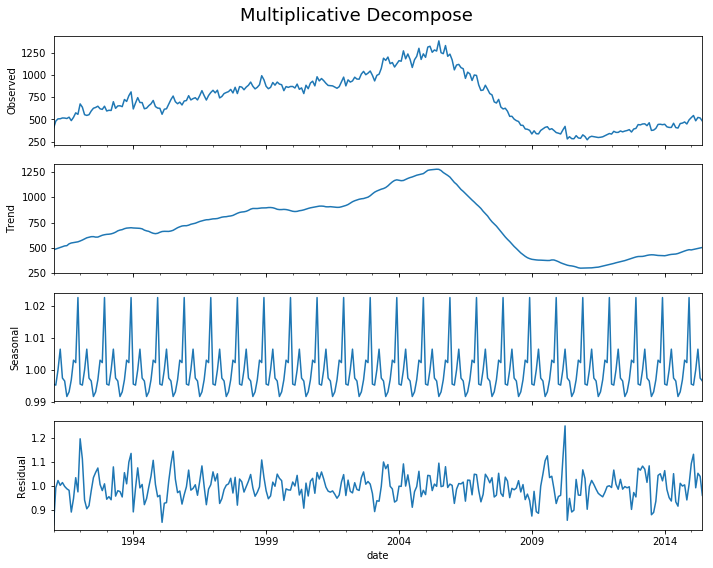

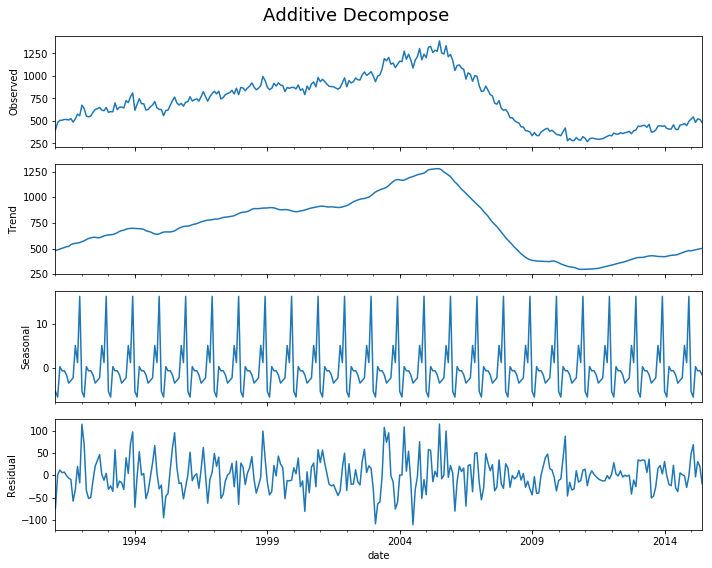

In [32]:
decomp(df_house.sales)

Multiplicative Model	: Observed 1807.370 = (Seasonal 2401.083 * Trend 0.875 * Resid 0.861)
Additive Model		: Observed 1807.370 = (Seasonal 2401.083 + Trend -452.058 + Resid -141.655)


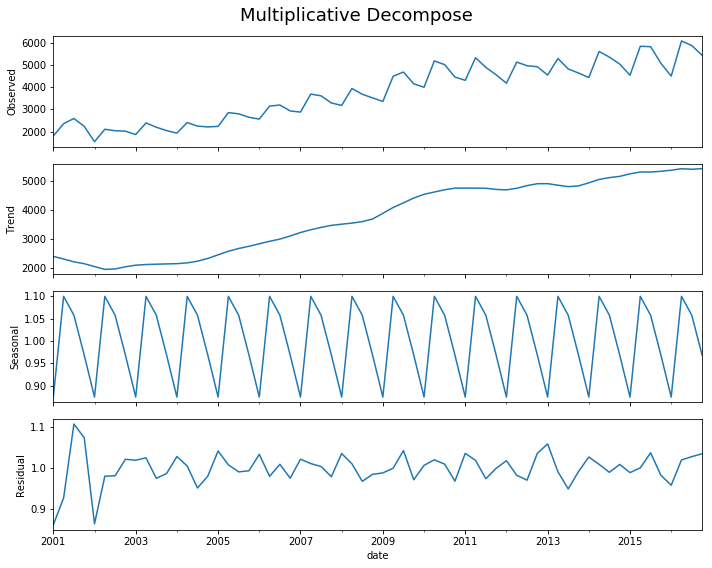

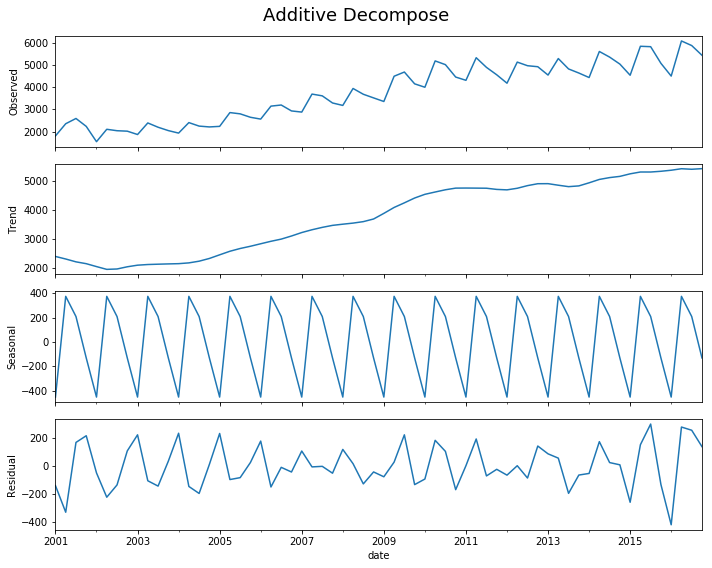

In [33]:
decomp(df_drink.sales)

### Detrend a time series

There are multiple approaches to remove the trend component from a time series:

1. Subtract the line of best fit from the time series. The line of best fit may be obtained from a linear regression model with the time steps as the predictor. For more complex trends, we can also add quadratic terms $x^2$ in the model.
2. Subtract the trend component obtained from time series decomposition we saw earlier.
3. Subtract the mean

We implement the first two methods. It is clear that the line of best fit is not enough to detrend the data.

In [34]:
def detrend(df_col, model = 'multiplicative'):
    # Using scipy: Subtract the line of best fit
    from scipy import signal
    import statsmodels.api as sm
    from statsmodels.tsa.seasonal import seasonal_decompose

    result_mul = sm.tsa.seasonal_decompose(df_col, model='multiplicative', extrapolate_trend='freq')
    result_add = sm.tsa.seasonal_decompose(df_col, model='additive', extrapolate_trend='freq')
    
    plt.subplots(1, 2, figsize=(12,4), dpi=80)
    detrended = signal.detrend(df_col.values)
    plt.subplot(1, 2, 1)
    plt.plot(detrended)
    plt.title('Subtracting the least squares fit', fontsize=16)

    if model=='multiplicative':
        detrended = df_col.values / result_mul.trend
    if model=='additive':
        detrended = df_col.values - result_add.trend
    plt.subplot(1, 2, 2)
    plt.plot(detrended)
    plt.title('Subtracting the trend component', fontsize=16)
    plt.show()
    
toggle()

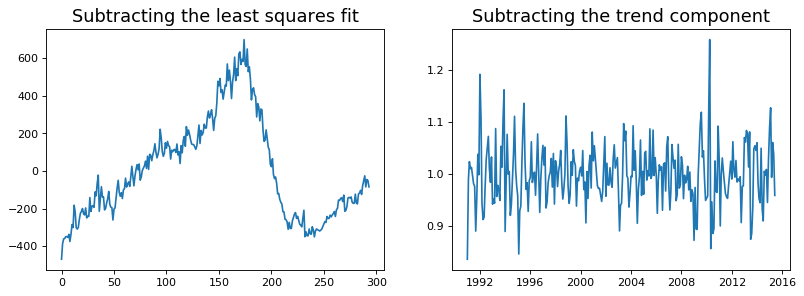

In [35]:
detrend(df_house['sales'])

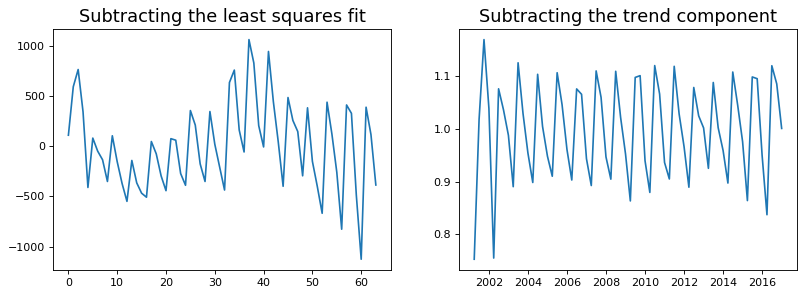

In [36]:
detrend(df_drink['sales'])

### Deseasonalize a time series

There are multiple approaches to deseasonalize a time series:
1. Take a moving average with length as the seasonal window. This will smoothen in series in the process.
2. Seasonal difference the series (subtract the value of previous season from the current value)
3. Divide the series by the seasonal index obtained from STL decomposition

If dividing by the seasonal index does not work well, try taking a log of the series and then do the deseasonalizing. You can later restore to the original scale by taking an exponential.

In [37]:
def deseasonalize(df_col, model, title=''):
    import statsmodels.api as sm
    from statsmodels.tsa.seasonal import seasonal_decompose
    
    plt.subplots(1, 1, figsize=(12,8))
    
    if model=='multiplicative' or model=='mul':
        result_mul = sm.tsa.seasonal_decompose(df_col, model='multiplicative', extrapolate_trend='freq')
        deseasonalized = df_col.values / result_mul.seasonal
    if model=='additive' or model=='add':
        result_add = sm.tsa.seasonal_decompose(df_col, model='additive', extrapolate_trend='freq')
        deseasonalized = df_col.values - result_add.seasonal
    
    plt.subplot(2,1,1)
    plt.plot(deseasonalized)
    plt.title('Deseasonalized {}'.format(title), fontsize=12)

toggle()

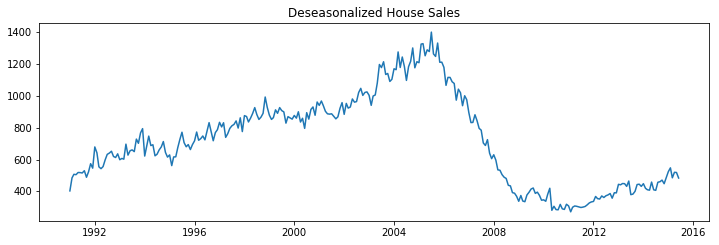

In [38]:
deseasonalize(df_house.sales, model='multiplicative', title='House Sales')

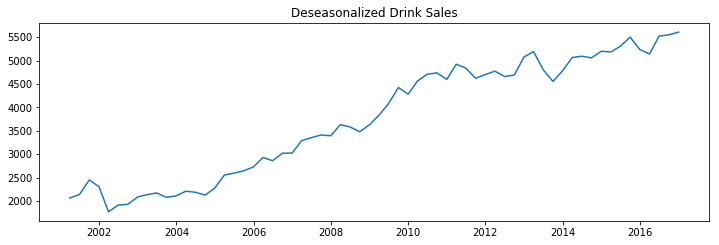

In [39]:
deseasonalize(df_drink.sales, model='multiplicative', title='Drink Sales')

### Test for seasonality

The common way is to plot the series and check for repeatable patterns in fixed time intervals. However, if you want a more definitive inspection of the seasonality, use the Autocorrelation Function (ACF) plot. Strong patterns in real word datasets is hardly noticed and can get distorted by any noise, so you need a careful eye to capture these patterns.

Alternately, if you want a statistical test, the Canova-Hansen test for seasonal differences can determine if seasonal differencing is required to stationarize the series.

In [40]:
def plot_autocorr(df_col, title=''):
    from pandas.plotting import autocorrelation_plot

    plt.rcParams.update({'figure.figsize':(8,3), 'figure.dpi':120})
    autocorrelation_plot(df_col.values)
    plt.title(title)
    plt.show()
    
toggle()

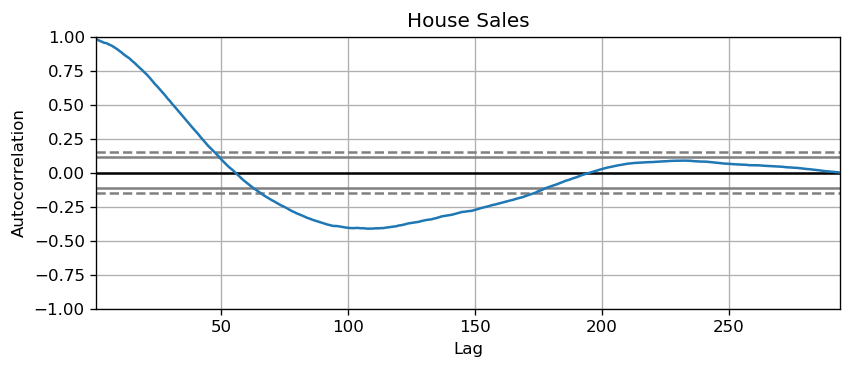

In [41]:
plot_autocorr(df_house.sales,'House Sales')

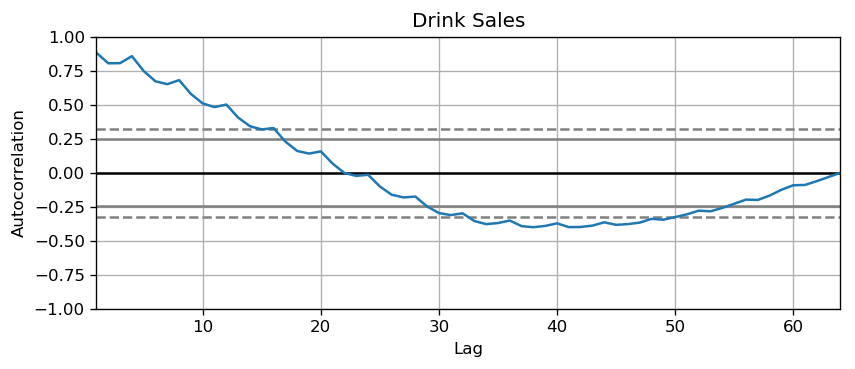

In [42]:
plot_autocorr(df_drink.sales,'Drink Sales')

### Missing values in a time series

When the time series have missing dates or times, the data was not captured or available for those periods. We may need to fill up those periods with a reasonable value. It is typically not a good idea to replace missing values with the mean of the series, especially if the series is not stationary.

Depending on the nature of the series, there are a few approaches are available:

- Forward Fill
- Backward Fill
- Linear Interpolation
- Quadratic interpolation
- Mean of nearest neighbors
- Mean of seasonal couterparts

In the demonstration, we manually introduce missing values to the time series and impute it with above approaches. Since the original non-missing values are known, we can measure the imputation performance by calculating the mean squared error (MSE) of the imputed against the actual values.

More interesting approaches can be considered:

- If explanatory variables are available, we can use a prediction model such as the random forest or k-Nearest Neighbors to predict missing values.
- If past observations are enough, we can forecast the missing values.
- If future observations are enough, we can backcast the missing values
- We can also forecast the counterparts from previous cycles.

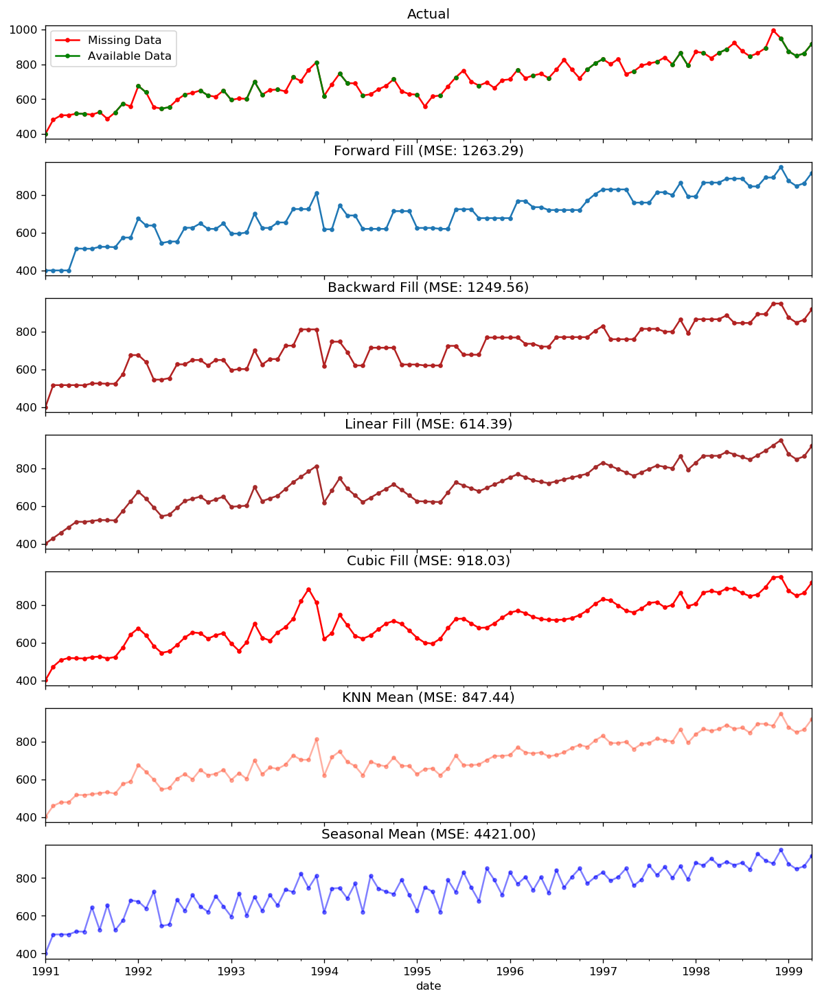

In [43]:
from scipy.interpolate import interp1d
from sklearn.metrics import mean_squared_error

dataurl = 'https://raw.githubusercontent.com/ming-zhao/Business-Analytics/master/data/time_series/'

# for easy demonstration, we only consider 100 observations
df_orig = pd.read_csv(dataurl+'house_sales.csv', parse_dates=['date'], index_col='date').head(100)

df_missing = pd.read_csv(dataurl+'house_sales_missing.csv', parse_dates=['date'], index_col='date')

fig, axes = plt.subplots(7, 1, sharex=True, figsize=(12, 15))
plt.rcParams.update({'xtick.bottom' : False})

## 1. Actual -------------------------------
df_orig.plot(y="sales", title='Actual', ax=axes[0], label='Actual', color='red', style=".-")
df_missing.plot(y="sales", title='Actual', ax=axes[0], label='Actual', color='green', style=".-")
axes[0].legend(["Missing Data", "Available Data"])

## 2. Forward Fill --------------------------
df_ffill = df_missing.ffill()
error = np.round(mean_squared_error(df_orig['sales'], df_ffill['sales']), 2)
df_ffill['sales'].plot(title='Forward Fill (MSE: ' + str(error) +")", 
                             ax=axes[1], label='Forward Fill', style=".-")
## 3. Backward Fill -------------------------
df_bfill = df_missing.bfill()
error = np.round(mean_squared_error(df_orig['sales'], df_bfill['sales']), 2)
df_bfill['sales'].plot(title="Backward Fill (MSE: " + str(error) +")", 
                             ax=axes[2], label='Back Fill', color='firebrick', style=".-")

## 4. Linear Interpolation ------------------
df_missing['rownum'] = np.arange(df_missing.shape[0])
df_nona = df_missing.dropna(subset = ['sales'])
f = interp1d(df_nona['rownum'], df_nona['sales'])
df_missing['linear_fill'] = f(df_missing['rownum'])
error = np.round(mean_squared_error(df_orig['sales'], df_missing['linear_fill']), 2)
df_missing['linear_fill'].plot(title="Linear Fill (MSE: " + str(error) +")", 
                       ax=axes[3], label='Cubic Fill', color='brown', style=".-")

## 5. Cubic Interpolation --------------------
f2 = interp1d(df_nona['rownum'], df_nona['sales'], kind='cubic')
df_missing['cubic_fill'] = f2(df_missing['rownum'])
error = np.round(mean_squared_error(df_orig['sales'], df_missing['cubic_fill']), 2)
df_missing['cubic_fill'].plot(title="Cubic Fill (MSE: " + str(error) +")", 
                              ax=axes[4], label='Cubic Fill', color='red', style=".-")

# Interpolation References:
# https://docs.scipy.org/doc/scipy/reference/tutorial/interpolate.html
# https://docs.scipy.org/doc/scipy/reference/interpolate.html

## 6. Mean of 'n' Nearest Past Neighbors ------
def knn_mean(ts, n):
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            n_by_2 = np.ceil(n/2)
            lower = np.max([0, int(i-n_by_2)])
            upper = np.min([len(ts)+1, int(i+n_by_2)])
            ts_near = np.concatenate([ts[lower:i], ts[i:upper]])
            out[i] = np.nanmean(ts_near)
    return out

df_missing['knn_mean'] = knn_mean(df_missing['sales'].values, 8)
error = np.round(mean_squared_error(df_orig['sales'], df_missing['knn_mean']), 2)
df_missing['knn_mean'].plot(title="KNN Mean (MSE: " + str(error) +")", 
                            ax=axes[5], label='KNN Mean', color='tomato', alpha=0.5, style=".-")

# 7. Seasonal Mean ----------------------------
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            out[i] = out[i-1]
            if ~ts_seas.isnull().all():
                if np.isnan(np.nanmean(ts_seas)):
                    ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
                out[i] = np.nanmean(ts_seas) * lr
    return out

df_missing['seasonal_mean'] = seasonal_mean(df_missing['sales'], n=6, lr=1.25)
error = np.round(mean_squared_error(df_orig['sales'], df_missing['seasonal_mean']), 2)
df_missing['seasonal_mean'].plot(title="Seasonal Mean (MSE: {:.2f})".format(error), 
                         ax=axes[6], label='Seasonal Mean', color='blue', alpha=0.5, style=".-")
plt.show()
toggle()

## Autocorrelation and Partial Autocorrelation Functions

### Autocorrelation

We can calculate the correlation for time series observations with observations in previous time steps, called lags. Because the correlation of the time series observations is calculated with values of the same series at previous times, this is called a serial correlation, or an autocorrelation. If a series is significantly autocorrelated, then the previous values of the series (lags) may be helpful in predicting the current value.

### Partial autocorrelation

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed (i.e., excluding the correlation contributions from the intermediate lags). The partial autocorrelation at lag $k$ is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.

The partial autocorrelation of lag (k) of a series is the coefficient of that lag in the autoregression equation of Y. The autoregressive equation of Y is nothing but the linear regression of Y with its own lags as predictors. For example, let $Y_t$ be the current value, then the partial autocorrelation of lag 3 ($Y_{t-3}$) is the coefficient $\alpha_3$ in the following equation:

$$Y_t = \alpha_0 + \alpha_1 Y_{t-1} + \alpha_2 Y_{t-2} + \alpha_3 Y_{t-3}$$

In [44]:
def plot_acf_pacf(df_col, acf_lag, pacf_lag):
    from statsmodels.tsa.stattools import acf, pacf
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    fig, axes = plt.subplots(1,2,figsize=(16,3), dpi=100)
    _ = plot_acf(df_col.values, lags=acf_lag, ax=axes[0])
    _ = plot_pacf(df_col.tolist(), lags=pacf_lag, ax=axes[1])
    
toggle()

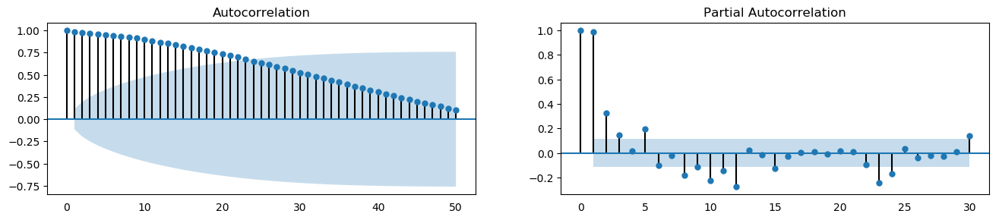

In [45]:
plot_acf_pacf(df_house.sales, 50, 30)

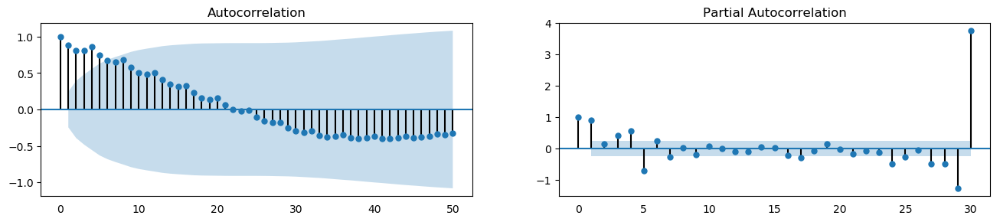

In [46]:
plot_acf_pacf(df_drink.sales, 50, 30)

### Plot lags

A Lag plot is a scatter plot of a time series against a lag of itself. It is normally used to check for autocorrelation. If there is any pattern existing in the series (such as house sales with lag 1 and drink sales with lag 4), the series is autocorrelated. If there is no pattern, the series is likely to be random white noise.

As shown in the figures, points get wide and scattered with increasing lag which indicates lesser correlation.

In [47]:
def update(house_lag, drink_lag):
    fig, axes = plt.subplots(1, 2, figsize=(12,4), dpi=100)
    lag_plot(df_house.sales, lag=house_lag, ax=axes[0], c='firebrick')
    axes[0].set_title('House Sales Lag Plot')
    lag_plot(df_drink.sales, lag=drink_lag, ax=axes[1], c='firebrick')
    axes[1].set_title('Drink Sales Lag Plot')
    plt.show()
    
interact(update, 
         house_lag=widgets.IntSlider(min=1,max=43,step=3,value=1,description='House Lag:'),
         drink_lag=widgets.IntSlider(min=1,max=43,step=3,value=1,description='Drink Lag:'))

def update(noise_lag, rndwalk_lag):
    fig, axes = plt.subplots(1, 2, figsize=(12,4), dpi=100)
    lag_plot(noise, lag=noise_lag, ax=axes[0], c='firebrick')
    axes[0].set_title('White noise Lag Plot')
    lag_plot(randomwalk(0.01), lag=rndwalk_lag, ax=axes[1], c='firebrick')
    axes[1].set_title('Random Walk Lag Plot')
    plt.show()
    
interact(update, 
         noise_lag=widgets.IntSlider(min=1,max=43,step=3,value=1,description='White Noise Lag:',
                                    style = {'description_width': 'initial'}),
         rndwalk_lag=widgets.IntSlider(min=1,max=43,step=3,value=1,description='Random Walk Lag:',
                                      style = {'description_width': 'initial'}))

toggle()

interactive(children=(IntSlider(value=1, description='House Lag:', max=43, min=1, step=3), IntSlider(value=1, …

interactive(children=(IntSlider(value=1, description='White Noise Lag:', max=43, min=1, step=3, style=SliderSt…

## Introduction to ARIMA Models

ARIMA is an acronym that stands for **AutoRegressive Integrated Moving Average**. It is a forecasting algorithm based on the idea that the information in the past values of the time series (i.e. its own lags and the lagged forecast errors) can alone be used to predict the future values.

Any **non-seasonal** time series that exhibits patterns and is not a random white noise can be modeled with ARIMA models.

The acronym ARIMA is descriptive, capturing the key aspects of the model itself. Briefly, they are:

- AR: Autoregression. A model that uses the dependent relationship between an observation and some number of lagged observations. An autoregressive model of order $p$ (AR$(p)$) can be written as

$$Y_{t} = c + \phi_{1}Y_{t-1} + \phi_{2}Y_{t-2} + \dots + \phi_{p}Y_{t-p} + e_{t},$$

- I: Integrated. The use of differencing of raw observations (e.g. subtracting an observation from an observation at the previous time step) in order to make the time series stationary.

- MA: Moving Average. A model that uses the dependency between an observation and a residual error from a moving average model applied to lagged observations. An moving average model of order $q$ (MA$(q)$) can be written as

$$Y_{t} = c + e_t + \theta_{1}e_{t-1} + \theta_{2}e_{t-2} + \dots + \theta_{q}e_{t-q}.$$

Each of these components are explicitly specified in the model as a parameter. A standard notation is used of ARIMA$(p,d,q)$ where the parameters are substituted with integer values to quickly indicate the specific ARIMA model being used. The parameters of the ARIMA model are defined as follows:

- $d$ is the number of differencing required to make the time series stationary
- $p$ is the number of lag observations included in the model, i.e., the order of the AR term
- $q$ is The size of the moving average window, i.e., the order of the MA term

The ARIMA$(p,d,q)$ model can be written as

\begin{equation}
Y^\prime_{t} = c + \phi_{1}Y^\prime_{t-1} + \cdots + \phi_{p}Y^\prime_{t-p} + \theta_{1}e_{t-1} + \cdots + \theta_{q}e_{t-q} + e_{t},
\end{equation}

where $Y^\prime_{t}$ is the differenced series (it may have been differenced more than once). The ARIMA$(p,d,q)$ model in words:

<br>
<center>
predicted $Y_t$ = Constant + Linear combination Lags of $Y$ (upto $p$ lags) + Linear Combination of Lagged forecast errors (upto $q$ lags)
</center>

The objective, therefore, is to identify the values of p, d and q. A value of 0 can be used for a parameter, which indicates to not use that element of the model. This way, the ARIMA model can be configured to perform the function of an ARMA model, and even a simple AR, I, or MA model.

**How to make a series stationary?**

The most common approach is to difference it. That is, subtract the previous value from the current value. Sometimes, depending on the complexity of the series, more than one differencing may be needed.

The value of $d$, therefore, is the **minimum** number of differencing needed to make the series stationary. And if the time series is already stationary, then $d = 0$.

**Why make the time series stationary?**

Because, term "Auto Regressive" in ARIMA means it is a linear regression model that uses its own lags as predictors. Linear regression models work best when the predictors are not correlated and are independent of each other. So we take differences to remove trend and seasonal structures that negatively affect the regression model.

### Identify the order of differencing

The right order of differencing is the minimum differencing required to get a near-stationary series which roams around a defined mean and the ACF plot reaches to zero fairly quick. If the autocorrelations are positive for many number of lags (10 or more), then the series needs further differencing. On the other hand, if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced. If we can't really decide between different orders of differencing, then go with the order that gives the least standard deviation in the differenced series.

In [48]:
def differencing(df, col_name, title='', period=2):
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

    plt.rcParams.update({'figure.figsize':(9,6), 'figure.dpi':150})
    # Original Series
    fig, axes = plt.subplots(period+1, 2, sharex='col')
    fig.tight_layout()

    axes[0, 0].plot(df.index, df[col_name])
    axes[0, 0].set_title('Original Series')
    _ = plot_acf(df[col_name].values, lags=50, ax=axes[0, 1])
    print('Standard deviation original series: {:.3f}'.format(np.std(df['sales'].values)))
    
    for t in range(period):
        axes[t+1, 0].plot(df.index, df[col_name].diff(t+1))
        axes[t+1, 0].set_title('{}st Order Differencing'.format(t+1))
        plot_acf(df[col_name].diff(t+1).dropna(), lags=50, ax=axes[t+1, 1])
        print('Standard deviation {}st differencing: {:.3f}'.format(t+1,np.std(df['sales'].diff(t+1).dropna().values)))
        
    plt.title(title)
    plt.show()
    
toggle()

Standard deviation original series: 279.720
Standard deviation 1st differencing: 48.344
Standard deviation 2st differencing: 57.802


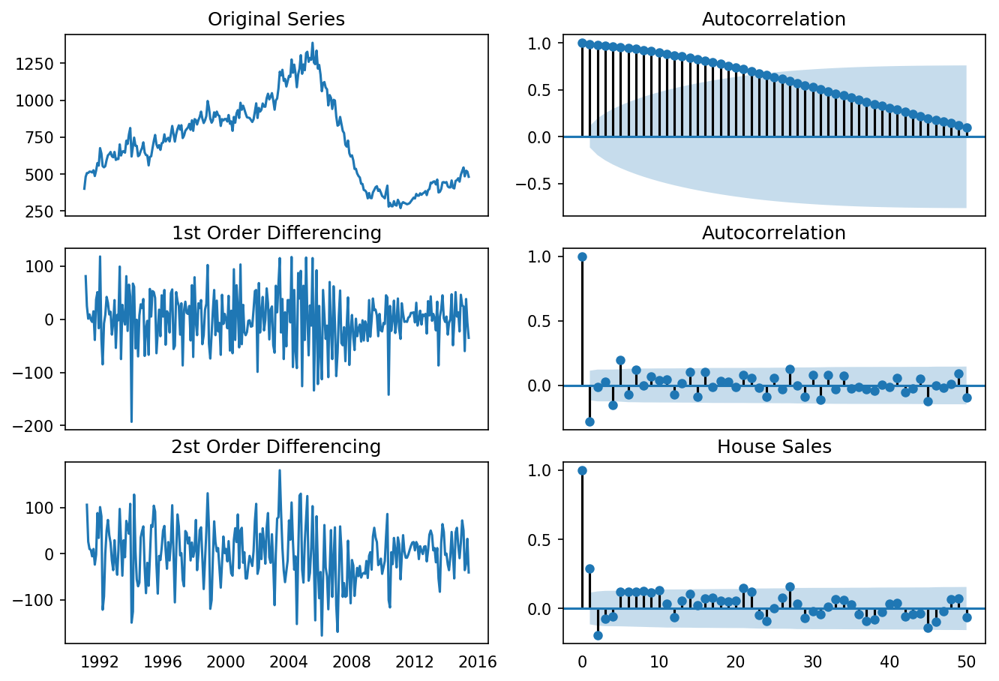

In [49]:
differencing(df_house, 'sales', title='House Sales')

Standard deviation original series: 1283.446
Standard deviation 1st differencing: 532.296
Standard deviation 2st differencing: 661.759


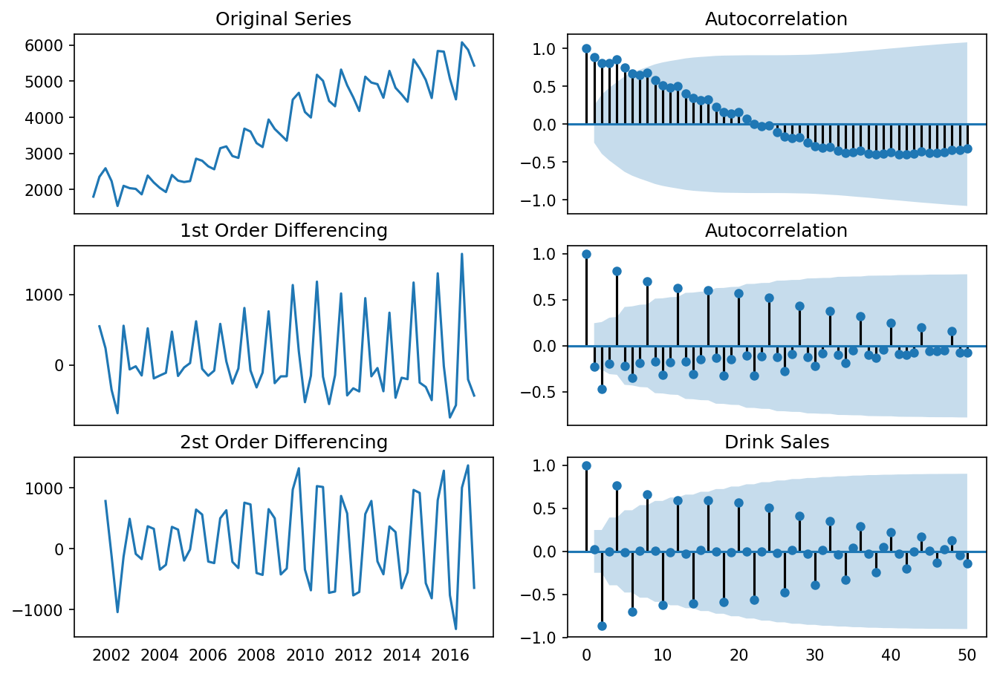

In [50]:
differencing(df_drink, 'sales', title='Drink Sales')

Recall that ADF test shows that the house sales data is not stationary. On looking at the autocorrelation plot for the first differencing the lag goes into the negative zone, which indicates that the series might have been over differenced. We tentatively fix the order of differencing as $d=1$ even though the series is a bit overdifferenced.

###  Identify the order of the MA and AR terms

- If the ACF of the differenced series displays a sharp cutoff and/or the lag-1 autocorrelation is negative - i.e., if the series appears slightly "overdifferenced" - then consider adding an MA term to the model. The lag at which the ACF cuts off is the indicated number of MA terms. 

- If the PACF of the differenced series displays a sharp cutoff and/or the lag-1 autocorrelation is positive - i.e., if the series appears slightly "underdifferenced" - then consider adding an AR term to the model. The lag at which the PACF cuts off is the indicated number of AR terms.


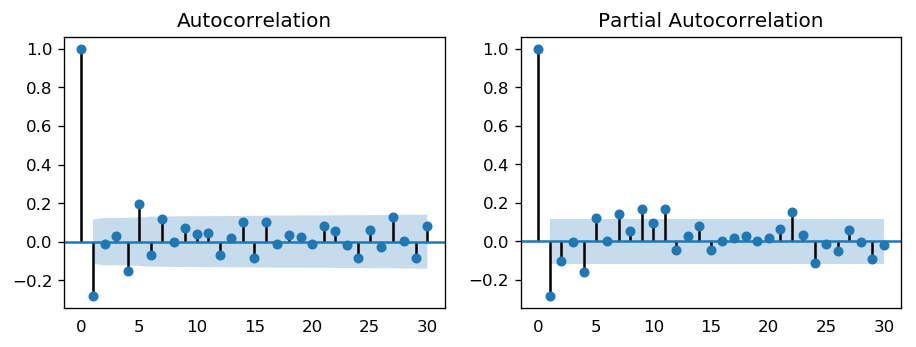

In [51]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2)
plot_acf(df_house.sales.diff().dropna(), lags=30, ax=axes[0])
plot_pacf(df_house.sales.diff().dropna(), lags=30, ax=axes[1])

plt.show()
toggle()

The single negative spike at lag 1 in the ACF is an MA(1) signature, according to rule above. Thus, if we were to use 1 nonseasonal differences, we would also want to include an MA(1) term, yielding an ARIMA(0,1,1) model. 

In most cases, the best model turns out a model that uses either only AR terms or only MA terms, although in some cases a "mixed" model with both AR and MA terms may provide the best fit to the data. However, care must be exercised when fitting mixed models. It is possible for an AR term and an MA term to cancel each other's effects, even though both may appear significant in the model (as judged by the t-statistics of their coefficients).

In [52]:
def update(p, d, q):
    from statsmodels.tsa.arima_model import ARIMA

    model = ARIMA(df_house.sales, order=(p, d, q))
    model_fit = model.fit(disp=0)
    print(model_fit.summary())

    # Plot residual errors
    residuals = pd.DataFrame(model_fit.resid)
    fig, ax = plt.subplots(1,2, figsize=(12,3))
    residuals.plot(title="Residuals", ax=ax[0])
    residuals.plot(kind='kde', title='Density', ax=ax[1])
    plt.show()

    plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})
    model_fit.plot_predict(dynamic=False)
    plt.show()

widgets.interact_manual.opts['manual_name'] = 'Run ARIMA'
interact_manual(update,
         p=widgets.BoundedIntText(value=0, min=0, step=1, description='p:', disabled=False),
         d=widgets.BoundedIntText(value=1, min=0, max=2, step=1, description='d:', disabled=False),
         q=widgets.BoundedIntText(value=1, min=0, step=1, description='q:', disabled=False))

toggle()

interactive(children=(BoundedIntText(value=0, description='p:'), BoundedIntText(value=1, description='d:', max…

The table in the middle is the coefficients table where the values under `coef` are the weights of the respective terms. Ideally, we expect to have the P-Value in `P>|z|` column is less than 0.05 for the respective `coef` to be significant.

The setting `dynamic=False` in `plot_predict` uses the in-sample lagged values for prediction. The model gets trained up until the previous value to make the next prediction. This setting can make the fitted forecast and actuals look artificially good. Hence, we seem to have a decent ARIMA model. But is that the best? Can't say that at this point because we haven't actually forecasted into the future and compared the forecast with the actual performance. The real validation you need now is the Out-of-Sample cross-validation.

### Identify the optimal ARIMA model

We create the training and testing datasets by splitting the time series into two contiguous parts in approximately 75:25 ratio or a reasonable proportion based on time frequency of series.

In [53]:
def forecast_accuracy(forecast, actual):
    from statsmodels.tsa.stattools import acf
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    acf1 = acf(forecast - actual)[1]            # ACF1
    return({'MAPE':mape, 'ME':me, 'MAE': mae, 
            'MPE': mpe, 'RMSE':rmse, 'ACF1':acf1, 
            'Corr':corr, 'Minmax':minmax})

def update(p, d, q):
    from statsmodels.tsa.arima_model import ARIMA
    
    test_size = int(df_house.shape[0]*.25)

    train = df_house.sales[:-test_size]
    test = df_house.sales[-test_size:]
    model = ARIMA(train, order=(p, d, q))  
    model_fit = model.fit(disp=0)  
    print(model_fit.summary())
    
    residuals = pd.DataFrame(model_fit.resid)
    fig, ax = plt.subplots(1,2, figsize=(12,3))
    residuals.plot(title="Residuals", ax=ax[0])
    residuals.plot(kind='kde', title='Density', ax=ax[1])
    plt.show()

    plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})
    
    # Forecast
    fc, se, conf = model_fit.forecast(test_size, alpha=0.05)  # 95% conf

    # Make as pandas series
    fc_series = pd.Series(fc, index=test.index)
    lower_series = pd.Series(conf[:, 0], index=test.index)
    upper_series = pd.Series(conf[:, 1], index=test.index)

    # Plot
    plt.plot(train, label='training')
    plt.plot(test, label='actual')
    plt.plot(fc_series, label='forecast')
    plt.fill_between(lower_series.index, lower_series, upper_series, 
                     color='k', alpha=.15)
    plt.title('Forecast vs Actuals')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()
    
    print('{:7s}: {:8.4f}'.format('MAPE', forecast_accuracy(fc, test.values)['MAPE']))

widgets.interact_manual.opts['manual_name'] = 'Run ARIMA'    
interact_manual(update,
         p=widgets.BoundedIntText(value=0, min=0, step=1, description='p:', disabled=False),
         d=widgets.BoundedIntText(value=1, min=0, max=2, step=1, description='d:', disabled=False),
         q=widgets.BoundedIntText(value=1, min=0, step=1, description='q:', disabled=False))

toggle()

interactive(children=(BoundedIntText(value=0, description='p:'), BoundedIntText(value=1, description='d:', max…

The model seems to give a directionally correct forecast and the actual observed values lie within the 95% confidence band. 

A much more convenient approach is to use `auto_arima()` which searches multiple combinations of $p,d,q$ parameters and chooses the best model. see `auto_arima()` [manual](https://www.alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html#pmdarima.arima.auto_arima) for parameters settings.

Fit ARIMA: order=(0, 1, 0); AIC=3108.202, BIC=3115.562, Fit time=0.004 seconds
Fit ARIMA: order=(1, 1, 0); AIC=3085.720, BIC=3096.761, Fit time=0.035 seconds
Fit ARIMA: order=(0, 1, 1); AIC=3082.268, BIC=3093.308, Fit time=0.025 seconds
Fit ARIMA: order=(1, 1, 1); AIC=3084.181, BIC=3098.901, Fit time=0.064 seconds
Fit ARIMA: order=(0, 1, 2); AIC=3084.182, BIC=3098.903, Fit time=0.049 seconds
Fit ARIMA: order=(1, 1, 2); AIC=3086.179, BIC=3104.580, Fit time=0.179 seconds
Total fit time: 0.368 seconds
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  293
Model:                 ARIMA(0, 1, 1)   Log Likelihood               -1538.134
Method:                       css-mle   S.D. of innovations             46.084
Date:                Fri, 26 Apr 2019   AIC                           3082.268
Time:                        21:39:04   BIC                           3093.308
Sample:               

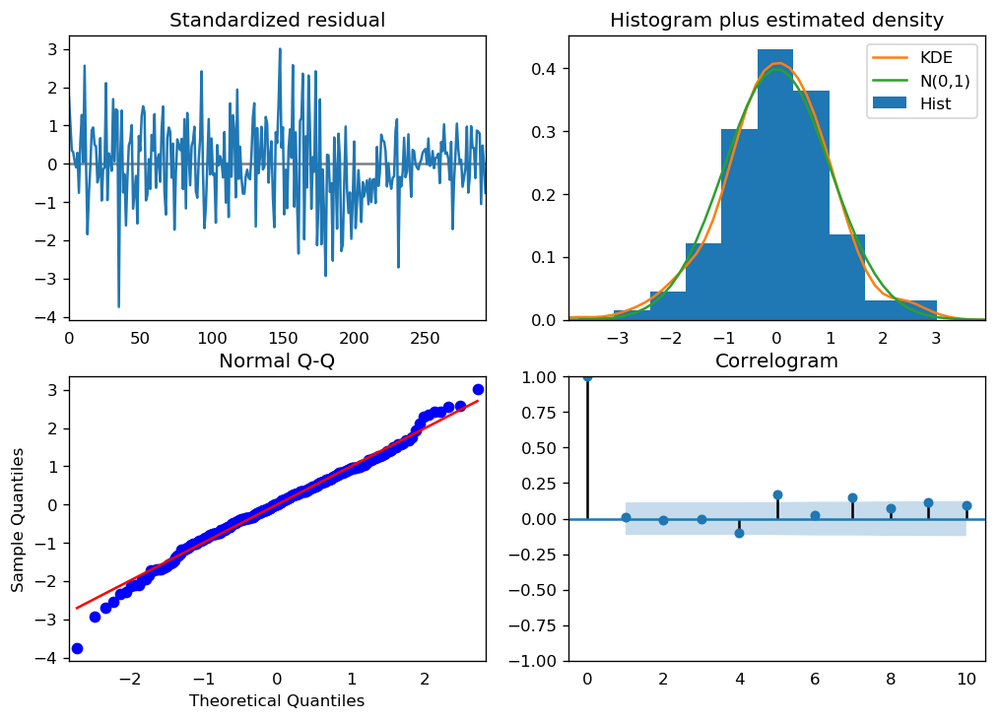

In [54]:
from statsmodels.tsa.arima_model import ARIMA

arima_house = pm.auto_arima(df_house.sales, 
                      start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=4, max_q=4, # maximum p and q
                      m=12,             # 12 for monthly data
                      d=None,           # let model determine 'd' differencing
                      seasonal=False,   # No Seasonality
                      #start_P=0,       # order of the auto-regressive portion of the seasonal model
                      #D=0,             # order of the seasonal differencing
                      #start_Q=0,       # order of the moving-average portion of the seasonal model
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima_house.summary())
_ = arima_house.plot_diagnostics(figsize=(10,7))
plt.show()
toggle()

We can review the residual plots. 

- Standardized resitual: The residual errors seem to fluctuate around a mean of zero and have a uniform variance.

- Histogram plus estimated density: The density plot suggests normal distribution with mean zero.

- Normal Q-Q: All the dots should fall perfectly in line with the red line. Any significant deviations would imply the distribution is skewed.

- Correlogram: The Correlogram (ACF plot) shows the residual errors are not autocorrelated. Any autocorrelation would imply that there is some pattern in the residual errors which are not explained in the model.

### ARIMA forecast

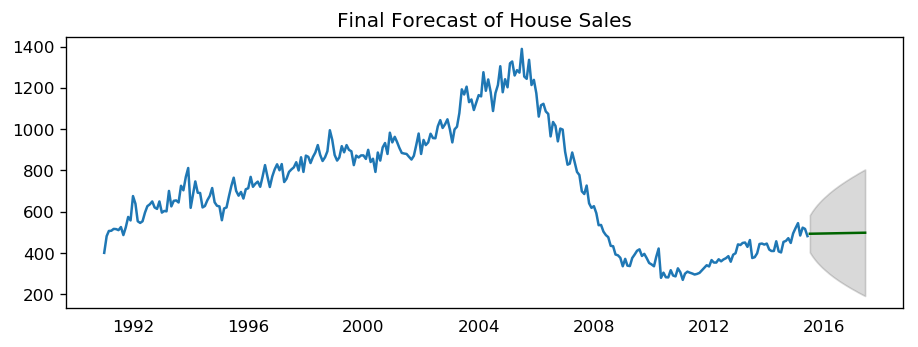

In [55]:
# Forecast
n_periods = 24
fc, conf = arima_house.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = pd.period_range(df_house.index[-1], freq='M', periods=n_periods+1)[1:].astype('datetime64[ns]') 

# make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)
lower_series = pd.Series(conf[:, 0], index=index_of_fc)
upper_series = pd.Series(conf[:, 1], index=index_of_fc)

# Plot
plt.plot(df_house.sales)
plt.plot(fc_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("Final Forecast of House Sales")
plt.show()

toggle()

### ARIMA vs Exponential smoothing models 

While linear exponential smoothing models are all special cases of ARIMA models, the non-linear exponential smoothing models have no equivalent ARIMA counterparts. On the other hand, there are also many ARIMA models that have no exponential smoothing counterparts. In particular, all exponential smoothing models are non-stationary, while some ARIMA models are stationary.

## Introductio to seasonal ARIMA (SARIMA) models

The ARIMA model does not support seasonality. If the time series data has defined seasonality, then we need to perform seasonal differencing and SARIMA models.

Seasonal differencing is similar to regular differencing, but, instead of subtracting consecutive terms, we subtract the value from previous season.

The model is represented as SARIMA$(p,d,q)x(P,D,Q)$, where
- $D$ is the order of seasonal differencing
- $P$ is the order of seasonal autoregression (SAR)
- $Q$ is the order of seasonal moving average (SMA)
- $x$ is the frequency of the time series.

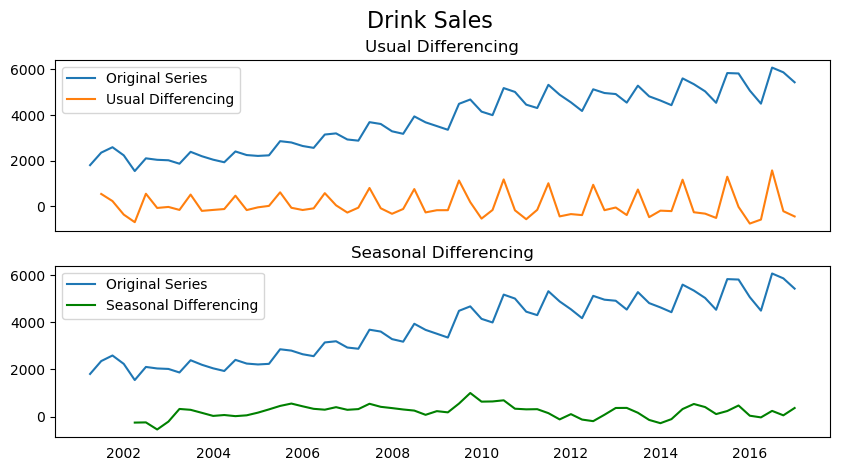

In [56]:
fig, axes = plt.subplots(2, 1, figsize=(10,5), dpi=100, sharex=True)

# Usual Differencing
axes[0].plot(df_drink.sales, label='Original Series')
axes[0].plot(df_drink.sales.diff(1), label='Usual Differencing')
axes[0].set_title('Usual Differencing')
axes[0].legend(loc='upper left', fontsize=10)


# Seasinal Differencing
axes[1].plot(df_drink.sales, label='Original Series')
axes[1].plot(df_drink.sales.diff(4), label='Seasonal Differencing', color='green')
axes[1].set_title('Seasonal Differencing')
plt.legend(loc='upper left', fontsize=10)
plt.suptitle('Drink Sales', fontsize=16)
plt.show()

toggle()

As we can clearly see, the seasonal spikes is intact after applying usual differencing (lag 1). Whereas, it is rectified after seasonal differencing.

### Build the SARIMA model

Find optimal SARIMA for house sales:

In [57]:
sarima_house = pm.auto_arima(df_house.sales, 
                       start_p=1, start_q=1,
                       test='adf',
                       max_p=3, max_q=3, m=4,
                       start_P=0, seasonal=True,
                       d=None, D=1, trace=True,
                       error_action='ignore', 
                       suppress_warnings=True,
                       stepwise=True)

sarima_house.summary()

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 4); AIC=3069.410, BIC=3087.760, Fit time=0.408 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 4); AIC=3317.294, BIC=3324.633, Fit time=0.027 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 4); AIC=3167.461, BIC=3182.140, Fit time=0.351 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 4); AIC=3242.302, BIC=3256.981, Fit time=0.345 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 4); AIC=3068.582, BIC=3090.601, Fit time=0.729 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 0, 4); AIC=3144.942, BIC=3163.292, Fit time=0.580 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 2, 4); AIC=3068.586, BIC=3094.275, Fit time=1.451 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 4); AIC=3236.794, BIC=3251.474, Fit time=0.173 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(2, 1, 2, 4); AIC=3071.836, BIC=3101.195, Fit time=1.378 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_o

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  294
Model:             SARIMAX(1, 0, 1)x(1, 1, 1, 4)   Log Likelihood               -1528.291
Date:                           Fri, 26 Apr 2019   AIC                           3068.582
Time:                                   21:39:15   BIC                           3090.601
Sample:                                        0   HQIC                          3077.404
                                           - 294                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0002      0.129      0.002      0.998      -0.254       0.254
ar.L1          0.9997      0.143      6.994      0.000       0.720       1.280
ma.L1         -0.3049      0.053     -5.765      0.000      -0.409      -0.201
ar.S.L4       -0.1031      0.056     -1.848      0.065      -0.212       0.006
ma.S.L4       -0.9982      0.647     -1.542      0.123      -2.267       0.271
sigma2      2109.4165   1043.105      2.022      0.043      64.968    4153.865
===================================================================================
Ljung-Box (Q):                       68.41   Jarque-Bera (JB):                 5.09
Prob(Q):                              0.00   Prob(JB):                         0.08
Heteroskedasticity (H):               0.55   Skew:                            -0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Find optimal SARIMA for drink sales

In [58]:
sarima_drink = pm.auto_arima(df_drink.sales, 
                       start_p=1, start_q=1,
                       test='adf',
                       max_p=3, max_q=3, m=4,
                       start_P=0, seasonal=True,
                       d=None, D=1, trace=True,
                       error_action='ignore', 
                       suppress_warnings=True,
                       stepwise=True)

sarima_drink.summary()

Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 1, 4); AIC=809.758, BIC=820.230, Fit time=0.166 seconds
Fit ARIMA: order=(0, 0, 0) seasonal_order=(0, 1, 0, 4); AIC=848.072, BIC=852.261, Fit time=0.011 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 4); AIC=813.490, BIC=821.867, Fit time=0.055 seconds
Fit ARIMA: order=(0, 0, 1) seasonal_order=(0, 1, 1, 4); AIC=813.808, BIC=822.185, Fit time=0.145 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 1, 4); AIC=811.146, BIC=823.712, Fit time=0.358 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 0, 4); AIC=810.383, BIC=818.760, Fit time=0.141 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(0, 1, 2, 4); AIC=811.498, BIC=824.064, Fit time=0.246 seconds
Fit ARIMA: order=(1, 0, 1) seasonal_order=(1, 1, 2, 4); AIC=813.467, BIC=828.127, Fit time=0.298 seconds
Fit ARIMA: order=(2, 0, 1) seasonal_order=(0, 1, 1, 4); AIC=811.201, BIC=823.767, Fit time=0.295 seconds
Fit ARIMA: order=(1, 0, 0) seasonal_order=(0, 1, 1, 4);

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                
=========================================================================================
Dep. Variable:                                 y   No. Observations:                   64
Model:             SARIMAX(1, 0, 1)x(0, 1, 1, 4)   Log Likelihood                -399.879
Date:                           Fri, 26 Apr 2019   AIC                            809.758
Time:                                   21:39:18   BIC                            820.230
Sample:                                        0   HQIC                           813.854
                                            - 64                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    121.9284     50.994      2.391      0.017      21.981     221.876
ar.L1          0.4436      0.178      2.492      0.013       0.095       0.793
ma.L1          0.5287      0.143      3.687      0.000       0.248       0.810
ma.S.L4       -0.2772      0.141     -1.969      0.049      -0.553      -0.001
sigma2      3.487e+04   6857.056      5.085      0.000    2.14e+04    4.83e+04
===================================================================================
Ljung-Box (Q):                       28.74   Jarque-Bera (JB):                 0.83
Prob(Q):                              0.91   Prob(JB):                         0.66
Heteroskedasticity (H):               1.28   Skew:                            -0.29
Prob(H) (two-sided):                  0.58   Kurtosis:                         3.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

### SARIMA forecast

In [59]:
def sarima_forcast(model, df, col_name, forecast_periods, freq):
    if freq=='month':
        periods = 12
    if freq=='quarter':
        periods = 4
    fitted, confint = model.predict(n_periods=forecast_periods, return_conf_int=True)
    if freq=='month':
        index_of_fc = pd.date_range(df.index[-1], periods = forecast_periods, freq='M')
    if freq=='quarter':
        index_of_fc = pd.date_range(df.index[-1], periods = forecast_periods, freq='3M')
        
    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
    plt.rcParams.update({'figure.figsize':(10,4), 'figure.dpi':120})
    plt.plot(df[col_name])
    plt.plot(fitted_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)

    plt.title("SARIMAX Forecast of Drink Sales")
    plt.show()
    
toggle()

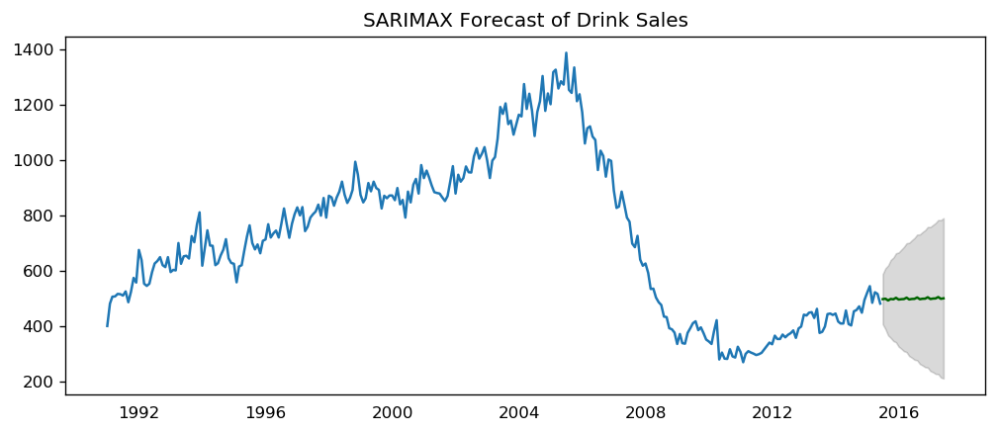

In [60]:
sarima_forcast(sarima_house, df_house, 'sales', forecast_periods=24, freq='month')

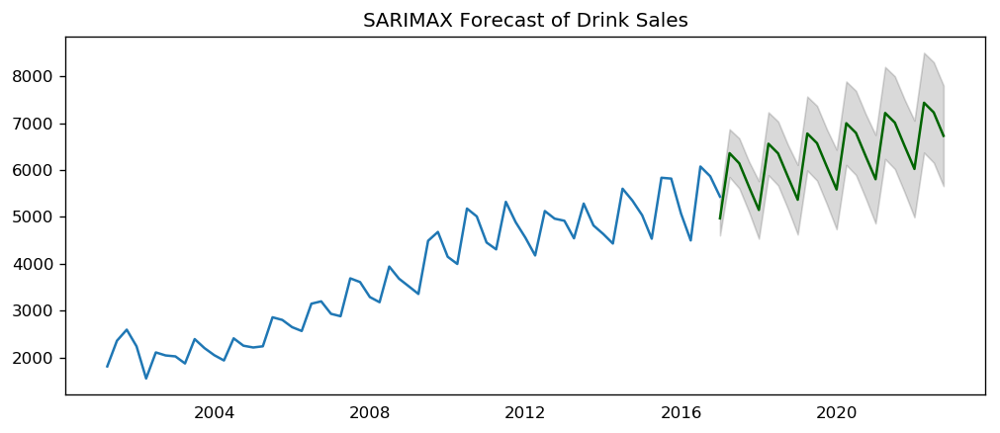

In [61]:
sarima_forcast(sarima_drink, df_drink, 'sales', forecast_periods=24, freq='quarter')

### SARIMAX Model with exogenous variable

We have a SARIMA model if there is an external predictor, also called, "exogenous variable" built into SARIMA models. The only requirement to use an exogenous variable is that we need to know the value of the variable during the forecast period as well.

For the sake of demonstration, we use the seasonal index from the classical seasonal decomposition on the latest 3 years of data even though SARIMA already modeling the seasonality. 

The seasonal index is a good exogenous variable for demonstration purpose because it repeats every frequency cycle, 4 quarters in this case. So, we always know what values the seasonal index will hold for the future forecasts.

In [62]:
def add_seasonal_index(df, col_name, freq='month', model='multiplicative'):
    from statsmodels.tsa.seasonal import seasonal_decompose
    if freq=='month':
        periods = 12
    if freq=='quarter':
        periods = 4
    seasonal_index = seasonal_decompose(df[col_name][-periods*3:],   # 3 years
                                    model=model, 
                                    extrapolate_trend='freq').seasonal[-periods:].to_frame()
    seasonal_index.columns = ['seasonal_index']
    if freq=='month':
        seasonal_index['month'] = [d.strftime('%b') for d in seasonal_index.index]
    if freq=='quarter':
        seasonal_index['quarter'] = ['Q'+str(d.month//3) for d in seasonal_index.index]
    df_tmp = pd.merge(df, seasonal_index, how='left', on=freq)
    df_tmp.index = df.index 
    return df_tmp

def sarimax_forcast(model, df, col_name, forecast_periods, freq):
    if freq=='month':
        periods = 12
    if freq=='quarter':
        periods = 4
    fitted, confint = model.predict(n_periods=forecast_periods, 
                                    exogenous=np.tile(df.seasonal_index[:periods],
                                                    forecast_periods//periods).reshape(-1,1),
                                    return_conf_int=True)
    if freq=='month':
        index_of_fc = pd.date_range(df.index[-1], periods = forecast_periods, freq='M')
    if freq=='quarter':
        index_of_fc = pd.date_range(df.index[-1], periods = forecast_periods, freq='3M')
        
    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
    plt.rcParams.update({'figure.figsize':(10,4), 'figure.dpi':120})
    plt.plot(df[col_name])
    plt.plot(fitted_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                     lower_series, 
                     upper_series, 
                     color='k', alpha=.15)

    plt.title("SARIMAX Forecast of Drink Sales")
    plt.show()
    
toggle()

In [63]:
df_drink = add_seasonal_index(df_drink, 'sales', freq='quarter', model='multiplicative')
sarimax_drink = pm.auto_arima(df_drink[['sales']], exogenous=df_drink[['seasonal_index']],
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)

sarimax_drink.summary()

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=727.512, BIC=739.103, Fit time=0.534 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=730.208, BIC=736.003, Fit time=0.022 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=726.746, BIC=736.405, Fit time=0.428 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=728.526, BIC=738.185, Fit time=0.308 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=732.167, BIC=739.895, Fit time=0.034 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(2, 1, 0, 12); AIC=728.728, BIC=740.319, Fit time=1.903 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 1, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(2, 1, 1, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=724.752, BIC=732.479, Fit time=0.350 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 12); AIC=726.6

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   64
Model:             SARIMAX(0, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -358.376
Date:                            Fri, 26 Apr 2019   AIC                            724.752
Time:                                    21:39:23   BIC                            732.479
Sample:                                         0   HQIC                           727.705
                                             - 64                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      5.4344     44.502      0.122      0.903     -81.787      92.656
x1            -0.0406   3.01e+04  -1.35e-06      1.000    -5.9e+04     5.9e+04
ar.S.L12      -0.4401      0.151     -2.922      0.003      -0.735      -0.145
sigma2      7.164e+04   1.95e+04      3.671      0.000    3.34e+04     1.1e+05
===================================================================================
Ljung-Box (Q):                       52.27   Jarque-Bera (JB):                 2.60
Prob(Q):                              0.09   Prob(JB):                         0.27
Heteroskedasticity (H):               1.70   Skew:                             0.54
Prob(H) (two-sided):                  0.28   Kurtosis:                         2.74
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

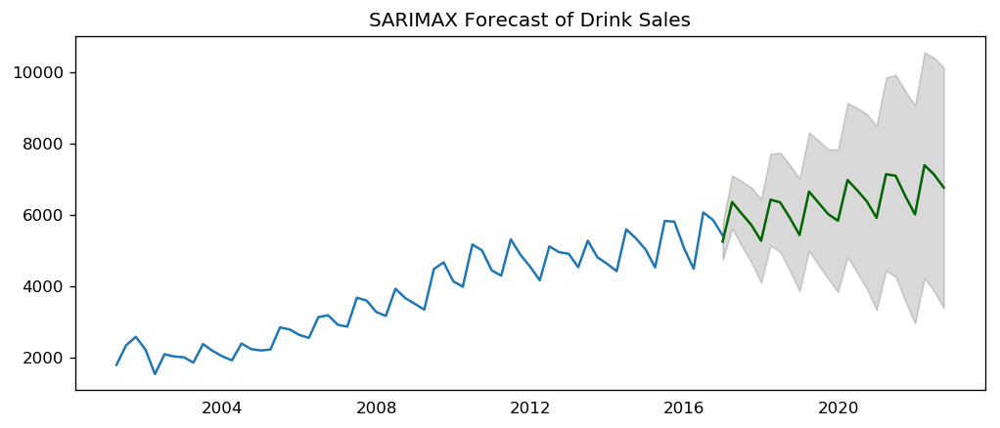

In [64]:
sarimax_forcast(sarimax_drink, df_drink, 'sales', forecast_periods=24, freq='quarter')

The coefficient of `x1` is small and p-value is large, so the contribution from seasonal index is negligible. 

## Case Study 

In [65]:
df_drug = pd.read_csv(dataurl+'drug_sales.csv', parse_dates=['date'], index_col='date')
df_drug['year'] = [d.year for d in df_drug.index]
df_drug['month'] = [d.strftime('%b') for d in df_drug.index]

Python code cheat sheet:

Analysis:
```python
df_drug.head()

plot_time_series(df_drug, 'sales', title='Drug Sales')

seasonal_plot(df_drug, ['month','sales'], title='Drug Sales')

boxplot(df_drug, ['month','sales'], title='Drug Sales')

stationarity_test(df_drug.sales, title='Drug Sales')

decomp(df_drug.sales)

detrend(df_drug['sales'])

deseasonalize(df_drug.sales, model, title='Drug Sales')
    #set model = 'multiplicative' or 'additive'#
    
plot_acf_pacf(df_drug.sales, acf_lag=50, pacf_lag=30)

differencing(df_drug, 'sales', title='Drug Sales')
```

SARIMA fitting and forecast:
```python
sarima_drug = pm.auto_arima(df_drug.sales, start_p=1, start_q=1,
                         test='adf',
                         max_p=3, max_q=3, m=12,
                         start_P=0, seasonal=True,
                         d=None, D=1, trace=True,
                         error_action='ignore',  
                         suppress_warnings=True, 
                         stepwise=True)

sarima_drug.summary()

sarima_forcast(sarima_drug, df_drug, 'sales', forecast_periods=24, freq='month')
```

SARIMAX fitting and forecast:
```python
df_drug = add_seasonal_index(df_drug, 'sales', freq='month', model='multiplicative')
sarimax_drug = pm.auto_arima(df_drug[['sales']], exogenous=df_drug[['seasonal_index']],
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)

sarimax_drug.summary()

sarimax_forcast(sarimax_drug, df_drug, 'sales', forecast_periods=24, freq='month')

```